In [1]:
# Saurabh Chatterjee  22EE65R14

In [1]:
import heapq
import ast
import random
import string
import os
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Huffman Coding

In [3]:
# COMPRESSION:   ----------------------------------------------------------------------------------------------

In [4]:
heap = []                #Heap Array
codes = {}               #Code Dictionary
reverse_mapping = {}
tree = []           

In [5]:
class Node:                                              # Creating Node Class
    def __init__(self, char, freq):
        self.char = char
        self.freq = freq
        self.left = None
        self.right = None

    def __lt__(self, other):
        return self.freq < other.freq

In [6]:
def make_frequency_dict(text):
    frequency={}                      #Frequency Dictionary
    for i in text:
        if i in frequency:
            frequency[i] += 1
        else:
            frequency[i] = 1
    return frequency

In [7]:
def make_heap(frequency):                      # Creating Min-Heap of Frequency Dictionary
    for key in frequency:
        node = Node(key, frequency[key])
        heapq.heappush(heap, node)

In [8]:
def merge_nodes():                             # Make TREE
    while(len(heap)>1):
        node1 = heapq.heappop(heap)
        node2 = heapq.heappop(heap)

        merged = Node('#', node1.freq + node2.freq)
        merged.left = node1
        merged.right = node2

        heapq.heappush(heap, merged)

In [9]:
def make_codes_helper(root, current_code):                  # Make CODE BOOK
    if(root == None):
        return

    if(root.char != '#'):
        codes[root.char] = current_code
        reverse_mapping[current_code] = root.char
        return

    make_codes_helper(root.left, current_code + "0")
    make_codes_helper(root.right, current_code + "1")


def make_codes():
    root = heapq.heappop(heap)
    heapq.heappush(heap, root)
    current_code = ""
    make_codes_helper(root, current_code)

In [10]:
def get_encoded_text(text):                        # Encode the Input Text
    encoded_text = ""
    for character in text:
        encoded_text += codes[character]
    return encoded_text

In [11]:
def tree_traverse(root):    #Pre-order tree traversal
    if root:
        # First print the data of node
        if (root.char == None):
            tree.append('#')
        else:
            tree.append(root.char)

        # Then recur on left child
        tree_traverse(root.left)

        # Finally recur on right child
        tree_traverse(root.right)

In [12]:
def add_tree_info(encoded_text):                # Add the Tree Info into the Encoded Text
    root = heapq.heappop(heap)
    tree_traverse(root)
    tree_str = ""
    tree_str = str(tree)   #Converting Tree to string
    tree_bits = ''.join(format(ord(i), '08b') for i in tree_str)    #Converting tree string to bits

    tree_len = len(tree_bits)
    print("Tree Length", tree_len)
    tree_info = "{0:016b}".format(tree_len)   # Adding 16-bit Tree Length Info (for case if tree len is more than 255)

    encoded_text_with_tree = tree_info + tree_bits + encoded_text

    return encoded_text_with_tree

In [13]:
def pad_encoded_text(encoded_text_with_tree):
    extra_padding = 8 - len(encoded_text_with_tree) % 8
    for i in range(extra_padding):
        encoded_text_with_tree = "0" + encoded_text_with_tree        #Padding zeros to the encoded text

    padded_info = "{0:08b}".format(extra_padding)      #Converted padding info value (decimal) into binary of length 8
    padded_encoded_text = padded_info + encoded_text_with_tree          #Padding info added in front of Encoded text
    return padded_encoded_text

In [14]:
def get_byte_array(padded_encoded_text):
    if(len(padded_encoded_text) % 8 != 0):
        print("Encoded text not padded properly")
        exit(0)

    b = bytearray()
    for i in range(0, len(padded_encoded_text), 8):
        byte = padded_encoded_text[i:i+8]
        b.append(int(byte, 2))
    return b

In [15]:
def compress(path):
    
    global heap, codes, reverse_mapping, tree      # For Resetting these variable's GLOBAL version 
                                                   # instead of creating their local version
                                                   # To prevent their old values to remain stored - make them flush
    
    heap = []             #Heap Array
    codes = {}            #Code Dictionary
    reverse_mapping = {}
    tree = []   

    output_path = "compressed" + ".huf"

    with open(path, 'r+') as file, open(output_path, 'wb') as output:
        text = file.read()

        frequency = make_frequency_dict(text)
        make_heap(frequency)
        merge_nodes()
        make_codes()

        encoded_text = get_encoded_text(text)
        encoded_text_with_tree = add_tree_info(encoded_text)

        padded_encoded_text = pad_encoded_text(encoded_text_with_tree)
        b = get_byte_array(padded_encoded_text)


        output.write(bytes(b))

    huf_file_stats = os.stat(output_path)
    huf_file_size = huf_file_stats.st_size
    
    print("Frequency Table: ", frequency)
    print("Code Book: ", codes)
    print("Tree", tree)
    print("Encodded Text for '",text,"':", encoded_text)
    
    return encoded_text, huf_file_size, output_path

In [16]:
# DECOMPRESSION    ----------------------------------------------------------------------------------------

In [17]:
letter_codes = {}
reverse_mapping2 = {}

In [18]:
def remove_padding(padded_encoded_text):
        padded_info = padded_encoded_text[:8]
        extra_padding = int(padded_info, 2)

        padded_encoded_text = padded_encoded_text[8:]  #Removing Padding information
        encoded_text_with_tree = padded_encoded_text[extra_padding:]   # Removing Padding

        return encoded_text_with_tree

In [19]:
def remove_tree(encoded_text_with_tree):
    tree_info = encoded_text_with_tree[:16]           # Since 16-bit Tree Length Info was stored
    tree_len = int(tree_info, 2)

    encoded_text_with_tree = encoded_text_with_tree[16:]   #Removing Tree Info
    tree_bits = encoded_text_with_tree[:tree_len]
    encoded_text = encoded_text_with_tree[tree_len:]

    return (tree_bits, encoded_text)

In [20]:
def draw_tree(tree_bits):
    tree_strg = ""                                       #Bits to String 
    for j in range(0, len(tree_bits), 8):
        tree_int = int(tree_bits[j:j+8], 2)           #Bits to Integer
        tree_strg += chr(tree_int)                     #Integer to ASCII Characters
        
    tree_list = eval(tree_strg)
    
    return tree_list

In [21]:
class Node1:
        def __init__(self, char):
            self.char = char
#             self.freq = freq
            self.left = None
            self.right = None
            
        def __lt__(self, other):
            return self.freq < other.freq

In [22]:
# Converting Tree string to Node types

def tree_strg_to_Node_Converter(tree_list):
    tree_strg_nodes = []                            # List containing Nodes
    while (len(tree_list) >0):
        nod = Node1(tree_list.pop(0))
        tree_strg_nodes.append(nod)
    tree_strg_nodes2 = tree_strg_nodes

    return tree_strg_nodes

In [23]:
def build_tree(tree_strg_nodes, node):                        # Building the Original Tree back
    node = tree_strg_nodes.pop(0)
    if (node.char == '#'):
        build_tree_recursor(node, tree_strg_nodes)
    else:
        return
    

def build_tree_recursor(node, tree_strg_nodes):
    node.left = tree_strg_nodes[0]
    build_tree(tree_strg_nodes, node.left)
    node.right = tree_strg_nodes.pop(0)
    if (node.right.char == '#'):
        build_tree_recursor(node.right, tree_strg_nodes)


            

In [24]:
def build_tree_initialiser(tree_strg_nodes):
    root = tree_strg_nodes[0]
    build_tree(tree_strg_nodes, root)
    return root

In [25]:
def make_codes_helper2(tree_root, tree_code):    
    if(tree_root == None):
        return

    if(tree_root.char != '#'):
        letter_codes[tree_root.char] = tree_code
        reverse_mapping2[tree_code] = tree_root.char
        return

    make_codes_helper2(tree_root.left, tree_code + "0")
    make_codes_helper2(tree_root.right, tree_code + "1")


def make_codes_2(tree_root):
    tree_code = ""
    make_codes_helper2(tree_root, tree_code)

In [26]:
def decode_text(encoded_text):
    current_text_code = ""
    decoded_text = ""

    for bit in encoded_text:
        current_text_code += bit
        if(current_text_code in reverse_mapping2):
            character = reverse_mapping2[current_text_code]
            decoded_text += character
            current_text_code = ""

    return decoded_text

In [27]:
def decompress(input_path):
    
    global letter_codes, reverse_mapping2          # For RESETTING these variable's GLOBAL version 
                                                   # instead of creating their local version
                                                   # To prevent their old values to remain stored - make them flush
    
    letter_codes = {}
    reverse_mapping2 = {}
    
        
    filename, file_extension = os.path.splitext(input_path)
    output_path = filename + "_decompressed" + ".txt"

    with open(input_path, 'rb') as file, open(output_path, 'w') as output:
        bit_string = ""

        byte = file.read(1)      #Read 1 Byte at a time
        while(len(byte) > 0):
            byte = ord(byte)        #Byte to Unicode
            bits = bin(byte)[2:].rjust(8, '0')        #Unicode to Bits (ignoring 0b at start) in lengths of 8
            bit_string += bits
            byte = file.read(1)

        encoded_text_with_tree = remove_padding(bit_string)
        tree_bits, encoded_text = remove_tree(encoded_text_with_tree)
        tree_list = draw_tree(tree_bits)
        print("Recovered Tree: ", tree_list)
        tree_strg_nodes = tree_strg_to_Node_Converter(tree_list)
        tree_root = build_tree_initialiser(tree_strg_nodes)
        make_codes_2(tree_root)
        print("Reverse Mapping Decodes: ", reverse_mapping2)
        print("letter codes", letter_codes)
        decoded_text = decode_text(encoded_text)


        output.write(decoded_text)



    print("Decompressed")
    print("Decoded Text for the Compressed file is:", decoded_text)
    return output_path 

In [28]:
# ----OVER--------------------------------------------------------------------------------------

In [46]:
# Compressing "hello" Text in the hello.txt File:

path = "hello.txt"

compress(path)

Tree Length 280
Frequency Table:  {'h': 1, 'e': 1, 'l': 2, 'o': 1}
Code Book:  {'h': '00', 'e': '01', 'o': '10', 'l': '11'}
Tree ['#', '#', 'h', 'e', '#', 'o', 'l']
Encodded Text for ' hello ': 0001111110


('0001111110', 40, 'compressed.huf')

In [47]:
# Decompressing the "compressed.huf" File to Recover the Original "hello" Text:

decompress("compressed.huf")

Recovered Tree:  ['#', '#', 'h', 'e', '#', 'o', 'l']
Reverse Mapping Decodes:  {'00': 'h', '01': 'e', '10': 'o', '11': 'l'}
letter codes {'h': '00', 'e': '01', 'o': '10', 'l': '11'}
Decompressed
Decoded Text for the Compressed file is: hello


'hello'

In [32]:
# LAB ASSIGNMENTS:

In [33]:
# Generating t = 10 different .txt files for each of N = {50, 100, 500, 1000, 5000}

N = (50, 100, 500, 1000, 5000)

for n in N:
    K=n
    for i in range(1,11):
        with open("text_file_{}_{}.txt".format(n,i), "w") as text_file:
            txt = str(''.join(random.choices(string.ascii_lowercase +
                                         string.digits, k=K)))

            text_file.write(txt)

            print(txt)

ec53seq1p3ie0fktio7ykke3244vvckfar3jowasq3p66qvly4
1mt7qrcgm8z7zj7l306btqny5vpjw2jf2wldxhnruioxecii1f
5mt15ryhnobv7jt9tnd8vji3jzdyynkpoyg7x2ul9dk2dajvxm
mhhvwbc8ogubp0z1ca0k7w1z7i5kjkkc7v82ghvy225jk46fvk
ndso797xb70w9ocjf2npm3xobx58840smz16jxx5az2cb43ng9
0plb6rp80o094rwnhry13m3rv0qh8438y5r59zwsv7xnw9qlw5
s1kzi7hybt48ank3bqpzjvfpd6c3bp0k7uwv8mjg2sb916geqi
zrplng68z3owt0c4dfhhwi6p3x448hxpd49ns4abx9wtodtha4
w9fyye5xxf24qo0750dlh4lfviihnfi3shbdmgzjgxds9bqj8t
5tder3lo60ufsn3051wwsnhz9w31766e65p6r8osz6iszar2id
67b4tl2nf0nvq6sbsw10j7075dnlhuhazq35k5wqcbtadp8mty9omofa7cr7j51q3p8tqe3rbqmsh5s3rwzxk4aopdu4lejx085f
xim8gf5e7k5y77zw0o7h34qkbebh1w74x9a54nsmushpgf1llbt1ym6um51f98wsr5yl1qghnykmw3dknbby07p8z7ayiu3pc8a8
tk8s39h62yy2u3y6crj68e1fcxkobhnd8z2cr3tu5amlof96rvmwouozww2k3uphk5cotzfyhuj0cj6e6tf53fczbbzox6byr1cv
x6mvk238od4sa6zr0vkwqpwpdn8tczxy65zp46kkk7gbjwhw0re561un6zkhfqtn56qx0zam4vpseispen2zzg54y581hbep0kao
gppsokakbps8s5fd440r1hq1byczu3wbneycafguxwcdr46vzttw3fczheafpninl96v8zw8x9crsktxtzpueo

Tree Length 1960
Frequency Table:  {'e': 4, 'c': 2, '5': 1, '3': 5, 's': 2, 'q': 3, '1': 1, 'p': 2, 'i': 2, '0': 1, 'f': 2, 'k': 4, 't': 1, 'o': 2, '7': 1, 'y': 2, '2': 1, '4': 3, 'v': 3, 'a': 2, 'r': 1, 'j': 1, 'w': 1, '6': 2, 'l': 1}
Code Book:  {'f': '0000', 'l': '00010', 'w': '00011', '7': '00100', 't': '00101', 'o': '0011', '3': '010', 'v': '0110', 'q': '0111', '4': '1000', 'e': '1001', '0': '101000', 'r': '101001', 'y': '10101', 'c': '10110', '6': '10111', 'a': '11000', 'p': '11001', 'k': '1101', 's': '11100', 'i': '11101', 'j': '111100', '2': '111101', '5': '111110', '1': '111111'}
Tree ['#', '#', '#', '#', 'f', '#', 'l', 'w', '#', '#', '7', 't', 'o', '#', '3', '#', 'v', 'q', '#', '#', '#', '4', 'e', '#', '#', '#', '0', 'r', 'y', '#', 'c', '6', '#', '#', '#', 'a', 'p', 'k', '#', '#', 's', 'i', '#', '#', 'j', '2', '#', '5', '1']
Encodded Text for ' ec53seq1p3ie0fktio7ykke3244vvckfar3jowasq3p66qvly4 ': 1001101101111100101110010010111111111110010101110110011010000000110100101111010

Frequency Table:  {'f': 16, 'c': 18, 'y': 17, 'u': 16, 'e': 15, 'b': 13, 'z': 11, 'n': 17, 'a': 11, '6': 17, 'g': 11, 't': 16, '2': 10, 'w': 14, 'p': 16, 'v': 12, 'q': 15, 'x': 18, 'm': 12, '8': 19, 'd': 14, 'i': 17, '9': 10, '3': 18, '1': 12, '5': 13, 'j': 20, 'k': 11, '4': 12, 'o': 13, '0': 13, 's': 12, 'h': 9, 'r': 11, '7': 11, 'l': 10}
Code Book:  {'a': '00000', 'g': '00001', 'm': '00010', 'v': '00011', '4': '00100', '1': '00101', 's': '00110', 'o': '00111', '0': '01000', '5': '01001', 'b': '01010', 'w': '01011', 'd': '01100', 'e': '01101', 'q': '01110', 'p': '01111', 't': '10000', 'u': '10001', 'f': '10010', 'y': '10011', 'i': '10100', '6': '10101', 'n': '10110', '3': '10111', 'c': '11000', 'x': '11001', 'h': '110100', '2': '110101', '8': '11011', 'j': '11100', '9': '111010', 'l': '111011', 'z': '111100', 'k': '111101', 'r': '111110', '7': '111111'}
Tree ['#', '#', '#', '#', '#', 'a', 'g', '#', 'm', 'v', '#', '#', '4', '1', '#', 's', 'o', '#', '#', '#', '0', '5', '#', 'b', 'w', '#

Frequency Table:  {'i': 129, 't': 150, 'q': 155, '5': 141, 'n': 132, 'j': 163, 'x': 124, 'b': 103, '6': 139, 'r': 122, 'd': 139, 'g': 151, 'k': 150, 'e': 134, '8': 141, '0': 132, 'c': 124, '2': 140, '7': 134, 'w': 158, 'a': 149, '3': 150, '1': 134, 'p': 151, 'm': 142, 'l': 121, 'o': 149, 'h': 134, 'y': 144, 's': 128, '4': 133, '9': 143, 'v': 132, 'f': 154, 'u': 135, 'z': 140}
Code Book:  {'0': '00000', 'v': '00001', '4': '00010', 'e': '00011', 'h': '00100', '1': '00101', '7': '00110', 'u': '00111', 'd': '01000', '6': '01001', 'z': '01010', '2': '01011', '8': '01100', '5': '01101', 'm': '01110', '9': '01111', 'y': '10000', 'o': '10001', 'a': '10010', 'k': '10011', '3': '10100', 't': '10101', 'p': '10110', 'g': '10111', 'f': '11000', 'q': '11001', 'w': '11010', 'j': '11011', 'b': '111000', 'l': '111001', 'r': '111010', 'x': '111011', 'c': '111100', 's': '111101', 'i': '111110', 'n': '111111'}
Tree ['#', '#', '#', '#', '#', '0', 'v', '#', '4', 'e', '#', '#', 'h', '1', '#', '7', 'u', '#', 

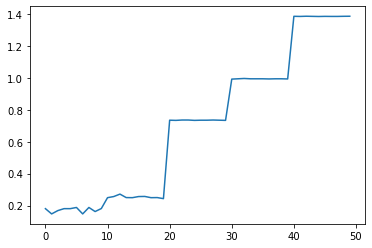

In [34]:
# ENCODE each of the above 50 files and store each as a separate .huf file. And,
# Determining Compression Ratio of each Text File to its Compressed File:

import shutil


N = (50, 100, 500, 1000, 5000)       # Text length with 10 files each
comp_ratio_arr = []*50               # Total 50 files

for n in N:
    K=n
    for i in range(1,11):
        file = "text_file_{}_{}.txt".format(n,i)
        
        file_stat = os.stat(file)
        file_size = file_stat.st_size
        
        encoded_text_bits, huff_size, output_path = compress(file)
        
        huf_file = "compressed_file_{}_{}.huf".format(n,i)
        shutil.copyfile(output_path, huf_file)                  #Copy Compressed .huf file to new renamed .huf file
            
        
        compress_ratio = file_size/huff_size
        comp_ratio_arr.append(compress_ratio)

plt.plot(comp_ratio_arr)        
            


Text(0.5, 1.0, 'Compression Ratio VS Lenth of Characters in Text File')

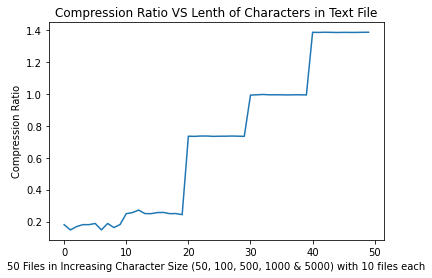

In [35]:
# PLOT of Compression Ratio VS Lenth of Characters in Text File:


plt.plot(comp_ratio_arr)
plt.ylabel('Compression Ratio')
plt.xlabel('50 Files in Increasing Character Size (50, 100, 500, 1000 & 5000) with 10 files each')
plt.title("Compression Ratio VS Lenth of Characters in Text File")

In [36]:
# RECOVER (Decode) the Compressed .huf Files

import shutil

N = (50, 100, 500, 1000, 5000)       # Text length with 10 files each

for n in N:
    K=n
    for i in range(1,11):
        huf_file = "compressed_file_{}_{}.huf".format(n,i)
        
        
        output_path = decompress(huf_file)
        
        recov_text_file = "text_file_recovered_{}_{}.txt".format(n,i)
        shutil.copyfile(output_path, recov_text_file)                  #Copy Decoded file to new renamed .txt file

Recovered Tree:  ['#', '#', '#', '#', 'f', '#', 'l', 'w', '#', '#', '7', 't', 'o', '#', '3', '#', 'v', 'q', '#', '#', '#', '4', 'e', '#', '#', '#', '0', 'r', 'y', '#', 'c', '6', '#', '#', '#', 'a', 'p', 'k', '#', '#', 's', 'i', '#', '#', 'j', '2', '#', '5', '1']
Reverse Mapping Decodes:  {'0000': 'f', '00010': 'l', '00011': 'w', '00100': '7', '00101': 't', '0011': 'o', '010': '3', '0110': 'v', '0111': 'q', '1000': '4', '1001': 'e', '101000': '0', '101001': 'r', '10101': 'y', '10110': 'c', '10111': '6', '11000': 'a', '11001': 'p', '1101': 'k', '11100': 's', '11101': 'i', '111100': 'j', '111101': '2', '111110': '5', '111111': '1'}
letter codes {'f': '0000', 'l': '00010', 'w': '00011', '7': '00100', 't': '00101', 'o': '0011', '3': '010', 'v': '0110', 'q': '0111', '4': '1000', 'e': '1001', '0': '101000', 'r': '101001', 'y': '10101', 'c': '10110', '6': '10111', 'a': '11000', 'p': '11001', 'k': '1101', 's': '11100', 'i': '11101', 'j': '111100', '2': '111101', '5': '111110', '1': '111111'}
De

Decompressed
Decoded Text for the Compressed file is: kffk0qncpcxx1h7xgzpha4897x25vfr4m9n0of3284w9owv5uulah2yskppmnbqfyukyv8tgnl2duansex7zjrg9f694i83eo35r20p4l3nps75za6se1o39tn84gkjkhbwkk5dgn2luvztwssz2p43qe3zjhewcoj3omyj72oh9txghmq70jhhdxsdehgrry06kilycuzpt9560yh1sosdrsjq69x3ltmzx4thr1llty9c5uwfxe5fo1a802a45koiqoy2e86mdcj1b6rpsjlbcgzh3hev36z107igj4631nib84pdrk7y302xna33vfrs46kpi5s4vg6mr6paqerr7yy8ebfo1un6isl23q1lhf1j8r1fdiifdnl7p1wk3ib5rni3he57a9mbrylv5ksl2g4vrkgpvwfhqvc7ecgp9yfkw18cvx2p1osd66mi4cj6wlp85j5xpe16crcofvrjzbl3hd7soy4wdbd4cvr9yyawweb8pz57mroa1o6g5mwb2qo2jhy70w2o0v6hetnsu8cbuwkbzc0nsa1cwtnp8yd3lnqd2z4s6w4cvqmruce6ht09prvdsp7qwxncvm9ga3q0g2igt1hrsayupcrt6vdgbpaci3ojfn41k6z34xc2h4yj1lyep512lv86y4najdpkkzjycsbf5z1q0huu6mqratsnkwjp8t5tq5ydf4dcwb9riy3m8eeiovbgjyo095l1v24du805jl8a63w7hvnj9vvdkyyjwmdnlx4os4kp5omicxzl2p661e32q7x9im5mr9f8hqpgtnacviyw4fdiltdzkiy25ygjq6gxnwt4wtue33ij0qek1zdgrwow55xg8ptl3p7yupvcu6jk86tt6u8cvaa7bf0ypkro888701dpog6otn7l35rmmhpd8hwmhxziawpgba87tj54trpsj6v

In [37]:
# Recovered ALL the Dataset !!

In [38]:
# DATASET-2 : Olivetti Images -------------------------------------------------------------------

In [78]:
import sklearn as sk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
from PIL import Image as im

In [79]:
#Importing Olivetti Dataset
#Has face images of 40 people and 10 images of each - so total 400 images, each 64X64 pixels
# Each Pixel has 8-bit Gray Scale representation, so 
# Each Image in Bits = (8 x 4096) bits

from sklearn import datasets
oliv = datasets.fetch_olivetti_faces(data_home="C://Users//Saurabh Chatterjee")   

In [80]:
oliv.keys()

dict_keys(['data', 'images', 'target', 'DESCR'])

In [81]:
oliv['data'].shape , oliv['images'].shape , oliv['target'].shape

((400, 4096), (400, 64, 64), (400,))

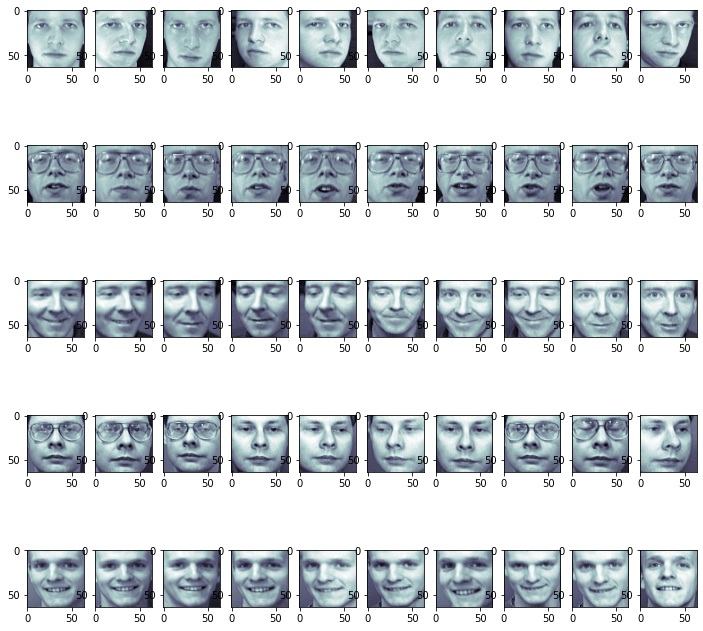

In [82]:
#Plotting the Face Figures - Selecting 50 face images of 5 people with 10 face images each

fig = plt.figure(figsize=(12,12))
for i in range(50):
    ax= fig.add_subplot(5,10,i+1)                         #Subplot with 5 rows and 10 cols (images) each row
    ax.imshow(oliv.images[i] , cmap=plt.cm.bone)
plt.show()

In [83]:
x = oliv.data
y = oliv.target

In [84]:
x.shape                                  # Total 400 images, each 64X64 pixels = 4096 pixels as features for each image

(400, 4096)

In [85]:
datasets.fetch_olivetti_faces(data_home="C://Users//Saurabh Chatterjee") 

{'data': array([[0.30991736, 0.3677686 , 0.41735536, ..., 0.15289256, 0.16115703,
         0.1570248 ],
        [0.45454547, 0.47107437, 0.5123967 , ..., 0.15289256, 0.15289256,
         0.15289256],
        [0.3181818 , 0.40082645, 0.49173555, ..., 0.14049587, 0.14876033,
         0.15289256],
        ...,
        [0.5       , 0.53305787, 0.607438  , ..., 0.17768595, 0.14876033,
         0.19008264],
        [0.21487603, 0.21900827, 0.21900827, ..., 0.57438016, 0.59090906,
         0.60330576],
        [0.5165289 , 0.46280992, 0.28099173, ..., 0.35950413, 0.3553719 ,
         0.38429752]], dtype=float32),
 'images': array([[[0.30991736, 0.3677686 , 0.41735536, ..., 0.37190083,
          0.3305785 , 0.30578512],
         [0.3429752 , 0.40495867, 0.43801653, ..., 0.37190083,
          0.338843  , 0.3140496 ],
         [0.3429752 , 0.41735536, 0.45041323, ..., 0.38016528,
          0.338843  , 0.29752067],
         ...,
         [0.21487603, 0.20661157, 0.2231405 , ..., 0.15289256,
     

In [86]:
oliv['data'].shape

(400, 4096)

In [87]:
oliv['images'].shape

(400, 64, 64)

In [88]:
# Saving the Face Images as GRAY SCALE ".bmp" File (400 Images each 64x64)

count = 0  # initialize counter

for i in range(oliv['images'].shape[0]):
    img = oliv.images[i]*255                       # Converting 0-1 Normalized values to 8-bit Gray Scale 0-255 Range
    count+=1
    img=np.uint8(img)                                         # Converting Float values to Integer
    img_object = im.fromarray(img)                            # Creating Image Object for Using PIL.Image.save()
    img_object.save(r'Olivetti face '+ str(count) +'.bmp')    # SAVING the Images as Gray-Scale ".bmp"



In [89]:
# COMPRESS Image Function:

def compress_image(image_array):
    
    global heap, codes, reverse_mapping, tree      # For Resetting these variable's GLOBAL version 
                                                   # instead of creating their local version
                                                   # To prevent their old values to remain stored - make them flush
    
    heap = []             #Heap Array
    codes = {}            #Code Dictionary
    reverse_mapping = {}
    tree = []   

    output_path = "image_compressed" + ".huf"

    with open(output_path, 'wb') as output:

        frequency = make_frequency_dict(image_array)
        make_heap(frequency)
        merge_nodes()
        make_codes()

        encoded_text = get_encoded_text(image_array)
        encoded_text_with_tree = add_tree_info(encoded_text)

        padded_encoded_text = pad_encoded_text(encoded_text_with_tree)
        b = get_byte_array(padded_encoded_text)


        output.write(bytes(b))

    huf_file_stats = os.stat(output_path)
    huf_file_size = huf_file_stats.st_size
    
    print("Frequency Table: ", frequency)
    print("Code Book: ", codes)
    print("Tree", tree)
    print("Encodded Text for '",image_array,"':", encoded_text)
    
    return encoded_text, huf_file_size, output_path

In [90]:
# Compressing the Images and storing as ".huf" Files:


import shutil

img_comp_ratio_arr = []*400 

for i in range(oliv['images'].shape[0]):
        img = plt.imread(r'Olivetti face '+ str(i+1) +'.bmp', format = "bmp")
        img_2d_array = np.array(img)
        img_array = img_2d_array.flatten()
        
        img_file = "Olivetti face {}.bmp".format(i+1)
        file_stat = os.stat(img_file)
        file_size = file_stat.st_size
        
        encoded_text_bits, huff_size, output_path = compress_image(img_array)
        
        huf_file = "Olivetti face {}.huf".format(i+1)
        shutil.copyfile(output_path, huf_file)                  #Copy Compressed .huf file to new renamed .huf file
            
        
        compress_ratio = file_size/huff_size
        img_comp_ratio_arr.append(compress_ratio)

Tree Length 13432
Frequency Table:  {79: 3, 93: 4, 106: 6, 112: 4, 134: 13, 154: 45, 167: 59, 172: 87, 175: 91, 174: 76, 179: 118, 178: 94, 177: 94, 180: 106, 181: 90, 183: 117, 185: 118, 192: 50, 197: 29, 198: 38, 193: 53, 199: 33, 195: 45, 188: 69, 189: 78, 182: 87, 184: 93, 187: 79, 161: 58, 144: 15, 133: 13, 113: 5, 94: 6, 84: 3, 77: 2, 87: 3, 103: 4, 111: 7, 120: 6, 141: 30, 159: 43, 170: 66, 200: 34, 201: 32, 194: 40, 190: 53, 171: 80, 162: 50, 153: 44, 130: 9, 86: 8, 80: 8, 114: 4, 146: 26, 164: 61, 204: 23, 203: 18, 186: 82, 145: 24, 110: 5, 96: 5, 75: 1, 104: 4, 151: 36, 166: 66, 207: 10, 205: 20, 202: 30, 165: 45, 138: 17, 97: 5, 88: 6, 67: 5, 85: 2, 107: 5, 121: 8, 148: 21, 163: 40, 169: 62, 173: 80, 191: 66, 168: 69, 124: 8, 99: 3, 100: 3, 155: 36, 206: 14, 150: 28, 122: 9, 83: 4, 95: 6, 135: 11, 160: 57, 81: 2, 92: 2, 142: 18, 158: 38, 72: 3, 63: 3, 149: 36, 139: 11, 102: 4, 90: 1, 147: 23, 157: 43, 56: 2, 152: 44, 140: 21, 143: 19, 71: 3, 50: 11, 74: 2, 136: 13, 131: 8, 1

Frequency Table:  {62: 4, 75: 7, 93: 7, 115: 17, 126: 15, 136: 21, 147: 26, 153: 32, 155: 33, 161: 52, 165: 54, 166: 61, 174: 55, 182: 68, 186: 68, 184: 73, 193: 58, 192: 70, 191: 61, 190: 74, 198: 68, 195: 67, 199: 49, 200: 64, 204: 48, 207: 42, 206: 52, 208: 35, 205: 60, 203: 48, 202: 57, 201: 60, 187: 56, 185: 68, 178: 59, 171: 45, 163: 46, 145: 21, 112: 14, 96: 8, 79: 6, 83: 5, 63: 10, 57: 2, 55: 6, 81: 11, 94: 3, 111: 12, 125: 15, 140: 20, 149: 31, 154: 31, 159: 46, 162: 48, 168: 51, 177: 45, 188: 87, 197: 51, 194: 58, 181: 69, 164: 57, 144: 22, 120: 17, 104: 7, 86: 8, 56: 2, 89: 8, 132: 14, 148: 31, 151: 37, 160: 38, 173: 49, 189: 74, 146: 31, 103: 13, 82: 8, 69: 6, 64: 3, 76: 7, 116: 7, 139: 25, 150: 22, 183: 76, 172: 39, 170: 50, 175: 59, 169: 37, 152: 27, 127: 10, 109: 12, 80: 6, 74: 5, 68: 7, 100: 5, 123: 12, 167: 47, 157: 34, 179: 57, 131: 20, 88: 6, 84: 3, 65: 7, 101: 4, 130: 19, 138: 19, 143: 23, 141: 23, 142: 21, 180: 63, 135: 28, 92: 5, 66: 3, 108: 7, 133: 16, 134: 10, 9

Frequency Table:  {149: 50, 151: 45, 173: 33, 177: 45, 182: 33, 178: 35, 185: 20, 189: 26, 188: 24, 192: 13, 194: 18, 197: 9, 199: 11, 201: 16, 198: 9, 202: 11, 200: 10, 195: 11, 193: 13, 190: 23, 191: 14, 186: 21, 180: 39, 181: 35, 179: 46, 175: 37, 171: 31, 170: 38, 166: 38, 165: 42, 167: 34, 168: 46, 161: 64, 154: 61, 157: 59, 138: 41, 153: 54, 139: 46, 150: 43, 160: 48, 158: 53, 203: 7, 209: 1, 187: 19, 174: 39, 172: 53, 162: 56, 136: 41, 159: 57, 141: 38, 155: 61, 206: 6, 213: 1, 205: 6, 169: 37, 163: 48, 183: 23, 207: 4, 164: 51, 152: 58, 148: 52, 184: 21, 147: 47, 145: 46, 143: 53, 131: 49, 134: 48, 146: 57, 144: 45, 142: 60, 132: 45, 126: 54, 123: 49, 124: 53, 121: 46, 120: 36, 112: 30, 116: 29, 118: 24, 122: 44, 130: 43, 111: 31, 105: 22, 113: 31, 115: 38, 125: 45, 127: 52, 110: 20, 109: 15, 108: 20, 104: 11, 114: 30, 128: 40, 129: 36, 102: 15, 91: 11, 93: 18, 95: 14, 92: 12, 101: 18, 133: 40, 119: 28, 135: 44, 100: 18, 94: 14, 85: 10, 81: 9, 82: 11, 84: 9, 140: 39, 107: 12, 1

Tree Length 14760
Frequency Table:  {43: 4, 46: 4, 52: 5, 82: 8, 114: 27, 139: 38, 153: 48, 174: 28, 178: 37, 181: 35, 186: 36, 191: 25, 192: 32, 193: 21, 194: 34, 199: 30, 203: 40, 205: 36, 207: 50, 208: 41, 210: 35, 211: 47, 212: 38, 209: 46, 204: 33, 198: 21, 197: 22, 187: 19, 182: 33, 185: 17, 184: 36, 163: 40, 148: 42, 145: 33, 138: 43, 126: 30, 44: 7, 50: 3, 84: 11, 111: 20, 128: 40, 169: 35, 177: 31, 180: 40, 195: 30, 200: 28, 201: 37, 206: 36, 213: 15, 190: 34, 179: 39, 162: 35, 141: 47, 142: 47, 146: 37, 124: 24, 41: 2, 48: 4, 80: 13, 113: 22, 131: 43, 152: 41, 202: 38, 158: 29, 140: 45, 125: 42, 33: 6, 38: 5, 81: 12, 118: 27, 134: 44, 183: 34, 189: 32, 216: 8, 188: 29, 168: 31, 143: 29, 129: 26, 34: 2, 36: 1, 45: 2, 119: 23, 136: 41, 159: 34, 214: 12, 167: 38, 144: 31, 133: 31, 35: 7, 83: 11, 121: 23, 154: 28, 32: 3, 24: 2, 92: 14, 165: 30, 155: 27, 132: 35, 37: 5, 21: 5, 94: 15, 166: 29, 127: 31, 42: 7, 18: 3, 97: 8, 173: 32, 171: 31, 130: 38, 47: 3, 93: 11, 150: 55, 157: 42

Tree Length 12064
Frequency Table:  {47: 2, 87: 7, 130: 35, 145: 49, 160: 58, 157: 54, 166: 52, 168: 45, 174: 33, 185: 36, 189: 37, 194: 49, 195: 41, 198: 45, 201: 58, 200: 47, 202: 52, 207: 24, 208: 28, 209: 29, 210: 32, 212: 11, 211: 16, 206: 24, 204: 49, 205: 34, 203: 50, 199: 51, 193: 40, 186: 32, 178: 40, 169: 52, 163: 40, 154: 63, 152: 54, 113: 28, 140: 50, 151: 45, 165: 34, 167: 54, 179: 31, 190: 40, 197: 41, 192: 43, 187: 41, 170: 40, 162: 48, 150: 56, 66: 4, 127: 36, 146: 59, 181: 25, 149: 44, 91: 5, 134: 29, 180: 34, 183: 23, 184: 31, 171: 40, 158: 57, 111: 19, 164: 46, 188: 48, 213: 1, 175: 30, 124: 26, 139: 39, 153: 53, 173: 29, 182: 21, 191: 47, 159: 40, 142: 37, 161: 46, 172: 37, 141: 38, 148: 50, 138: 48, 136: 34, 131: 34, 129: 29, 177: 38, 135: 36, 121: 32, 133: 24, 132: 26, 144: 35, 155: 53, 125: 29, 116: 20, 108: 19, 103: 17, 93: 9, 97: 6, 110: 18, 119: 31, 95: 9, 99: 13, 100: 11, 105: 8, 147: 54, 86: 4, 85: 10, 106: 12, 92: 11, 90: 12, 89: 8, 94: 9, 122: 31, 120: 21,

Frequency Table:  {129: 18, 138: 23, 149: 24, 157: 30, 155: 42, 159: 45, 162: 44, 169: 44, 172: 44, 179: 51, 183: 41, 184: 54, 185: 52, 187: 45, 190: 52, 194: 46, 199: 37, 201: 38, 202: 50, 205: 32, 206: 48, 208: 64, 207: 55, 209: 46, 204: 41, 200: 35, 195: 46, 180: 56, 175: 41, 173: 29, 171: 37, 124: 27, 132: 33, 145: 20, 153: 31, 158: 38, 168: 48, 188: 61, 189: 51, 186: 42, 192: 46, 198: 32, 203: 32, 210: 26, 182: 45, 170: 29, 114: 20, 126: 19, 141: 23, 150: 25, 161: 38, 181: 36, 193: 41, 191: 37, 177: 35, 106: 18, 120: 24, 136: 11, 178: 48, 197: 32, 100: 37, 151: 36, 154: 26, 167: 37, 89: 38, 109: 26, 142: 19, 83: 10, 103: 26, 144: 29, 152: 32, 166: 38, 213: 3, 214: 2, 212: 7, 76: 4, 99: 45, 148: 29, 163: 45, 174: 41, 82: 6, 93: 43, 160: 39, 131: 17, 92: 26, 104: 18, 133: 34, 143: 30, 140: 18, 123: 20, 127: 19, 146: 33, 134: 27, 139: 17, 165: 19, 164: 37, 105: 33, 113: 23, 118: 23, 115: 24, 107: 15, 121: 22, 125: 26, 147: 31, 110: 18, 108: 18, 111: 16, 122: 17, 101: 27, 86: 24, 88: 

Frequency Table:  {181: 84, 179: 59, 183: 58, 187: 63, 191: 42, 197: 35, 202: 39, 203: 33, 205: 32, 207: 30, 208: 20, 210: 16, 212: 25, 214: 16, 218: 12, 221: 13, 222: 16, 220: 13, 219: 5, 217: 15, 209: 27, 201: 24, 206: 26, 199: 42, 200: 29, 195: 40, 188: 53, 190: 38, 185: 77, 184: 59, 182: 62, 177: 53, 164: 51, 158: 41, 151: 36, 143: 43, 141: 40, 138: 42, 136: 51, 129: 42, 100: 5, 180: 49, 186: 72, 204: 31, 211: 14, 213: 17, 216: 14, 192: 42, 189: 52, 170: 56, 161: 47, 154: 46, 146: 44, 131: 38, 107: 7, 198: 28, 194: 33, 193: 45, 172: 34, 163: 48, 153: 44, 147: 44, 142: 35, 139: 49, 135: 43, 118: 20, 178: 59, 223: 5, 224: 2, 175: 57, 165: 57, 128: 29, 173: 48, 167: 43, 157: 43, 148: 32, 133: 37, 174: 51, 168: 38, 160: 35, 155: 39, 171: 41, 144: 42, 134: 38, 145: 46, 150: 42, 166: 40, 152: 44, 140: 31, 149: 37, 120: 17, 121: 20, 126: 35, 132: 37, 112: 10, 123: 16, 101: 8, 70: 1, 169: 50, 159: 35, 130: 34, 124: 25, 122: 28, 104: 10, 82: 3, 239: 5, 241: 1, 125: 26, 162: 45, 111: 10, 99:

Frequency Table:  {52: 13, 71: 2, 93: 11, 100: 14, 173: 29, 182: 42, 184: 33, 188: 47, 191: 54, 195: 59, 200: 69, 203: 52, 205: 63, 204: 38, 206: 35, 209: 45, 208: 35, 207: 43, 198: 61, 193: 64, 190: 49, 187: 42, 186: 49, 185: 39, 197: 69, 199: 61, 194: 49, 201: 55, 202: 50, 211: 30, 221: 3, 169: 35, 57: 4, 31: 2, 25: 1, 36: 3, 32: 2, 55: 7, 86: 6, 104: 11, 126: 26, 183: 36, 210: 46, 189: 48, 192: 58, 213: 39, 217: 11, 115: 23, 37: 4, 29: 1, 73: 4, 108: 17, 95: 19, 149: 31, 214: 27, 223: 1, 180: 41, 62: 12, 38: 3, 90: 6, 109: 14, 174: 30, 212: 31, 219: 4, 226: 2, 105: 11, 65: 9, 50: 3, 101: 12, 121: 28, 181: 22, 218: 9, 216: 15, 229: 1, 164: 35, 80: 4, 40: 1, 97: 9, 157: 29, 179: 32, 172: 27, 168: 27, 165: 38, 166: 27, 159: 36, 220: 6, 87: 13, 96: 12, 47: 4, 111: 21, 175: 24, 178: 26, 160: 40, 154: 40, 153: 29, 146: 39, 145: 42, 143: 36, 161: 37, 147: 31, 136: 32, 118: 20, 114: 18, 122: 25, 124: 21, 125: 20, 131: 31, 128: 30, 148: 27, 236: 2, 123: 26, 91: 7, 60: 5, 141: 38, 167: 28, 14

Encodded Text for ' [59 56 52 ... 73 49 57] ': 00111111100100011000110000001100011101110100011111110110101100100011001111111010101010010000110000001011010111100110011000100101111011101011010011001111001111100000011100101110000011100000011100011101100101101011110100111010110011111100011001010110111001010111100110010110011100010111101101011110101110101101011101011110101110101110011110011101011111010110011110000100111111010100110001101000011110011000111110001101010000110100100100001101101101011001000111110001011101101011111110100111011100011111110010000010110110101000100010111000111101100101110101100010101101110101111011101011100001100001010010101111100001001110101110101110100110011101010011100111101010100100111010101101111100010010111001010101011011110111001011100101111100111010111010010010110101111101111101111010111010101011111101111101110101100111110010110010101001111010101000000011010000001001001110001100010010000100001000110010001100100011011000011111010011100011011000101110111000110

Tree Length 15024
Frequency Table:  {89: 10, 110: 12, 141: 25, 165: 22, 180: 45, 191: 40, 201: 59, 208: 70, 211: 109, 210: 103, 212: 125, 213: 99, 216: 74, 217: 55, 214: 74, 209: 102, 205: 55, 203: 51, 202: 53, 198: 54, 183: 35, 169: 21, 151: 35, 139: 27, 122: 9, 105: 7, 84: 4, 74: 4, 56: 4, 41: 1, 43: 4, 47: 2, 54: 2, 55: 3, 96: 4, 128: 18, 158: 29, 174: 41, 185: 39, 195: 61, 206: 80, 200: 43, 192: 42, 181: 33, 166: 31, 147: 23, 136: 19, 129: 18, 109: 15, 91: 5, 87: 2, 82: 7, 62: 3, 42: 5, 44: 3, 116: 4, 146: 19, 170: 36, 182: 47, 189: 40, 204: 67, 197: 50, 190: 37, 178: 44, 163: 29, 138: 30, 133: 15, 88: 5, 80: 5, 68: 2, 45: 1, 135: 29, 160: 24, 187: 57, 193: 41, 199: 59, 194: 34, 152: 25, 142: 31, 71: 4, 67: 2, 49: 3, 148: 30, 167: 35, 207: 62, 179: 35, 162: 32, 161: 27, 150: 41, 159: 25, 177: 52, 188: 56, 168: 37, 164: 24, 153: 25, 149: 30, 145: 27, 144: 26, 127: 15, 103: 6, 76: 3, 70: 2, 64: 5, 66: 4, 63: 3, 172: 40, 155: 28, 125: 10, 126: 13, 131: 18, 134: 20, 132: 14, 175: 41, 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Frequency Table:  {128: 32, 136: 56, 134: 39, 146: 69, 132: 48, 129: 38, 139: 52, 149: 73, 162: 70, 163: 66, 152: 74, 143: 54, 133: 47, 144: 72, 148: 76, 154: 78, 160: 66, 159: 63, 157: 70, 153: 62, 161: 60, 158: 51, 166: 59, 165: 70, 122: 32, 130: 25, 141: 66, 140: 57, 155: 67, 145: 62, 111: 16, 82: 5, 80: 5, 100: 14, 127: 38, 135: 44, 167: 60, 171: 61, 131: 40, 138: 54, 147: 73, 150: 72, 142: 60, 121: 21, 101: 15, 110: 11, 164: 59, 168: 69, 169: 56, 172: 54, 170: 63, 179: 41, 177: 47, 182: 32, 151: 77, 125: 31, 174: 46, 175: 45, 173: 50, 181: 35, 178: 41, 184: 26, 183: 36, 186: 31, 180: 42, 187: 20, 198: 1, 185: 40, 189: 22, 188: 26, 194: 9, 192: 14, 199: 8, 190: 23, 195: 6, 191: 17, 204: 2, 193: 10, 201: 5, 123: 26, 118: 25, 120: 18, 124: 32, 116: 23, 103: 10, 105: 12, 88: 12, 83: 6, 84: 11, 115: 22, 126: 30, 113: 19, 92: 10, 85: 8, 86: 7, 87: 6, 99: 16, 102: 17, 114: 10, 97: 9, 90: 6, 71: 7, 72: 12, 76: 6, 95: 6, 106: 10, 107: 12, 112: 12, 104: 8, 91: 4, 67: 4, 61: 6, 65: 3, 63: 6,

Frequency Table:  {124: 22, 142: 28, 146: 37, 144: 30, 143: 28, 151: 62, 159: 50, 160: 62, 164: 61, 171: 86, 168: 86, 169: 72, 172: 89, 170: 87, 173: 89, 174: 68, 175: 87, 180: 82, 179: 64, 185: 89, 189: 53, 190: 54, 188: 60, 187: 63, 192: 39, 191: 41, 182: 56, 183: 72, 181: 82, 184: 58, 178: 88, 161: 64, 155: 50, 150: 48, 133: 29, 145: 47, 158: 55, 177: 75, 186: 57, 167: 58, 157: 47, 152: 37, 138: 26, 148: 46, 147: 36, 154: 43, 163: 43, 166: 73, 162: 55, 153: 39, 140: 19, 149: 48, 165: 64, 193: 29, 194: 27, 197: 10, 198: 13, 139: 30, 135: 20, 123: 15, 125: 27, 127: 19, 128: 24, 136: 32, 200: 9, 195: 20, 199: 13, 130: 21, 134: 26, 129: 16, 132: 24, 106: 11, 96: 13, 104: 18, 107: 16, 108: 14, 111: 13, 110: 15, 113: 13, 120: 13, 201: 7, 115: 15, 95: 14, 91: 14, 93: 7, 99: 8, 100: 12, 94: 8, 97: 11, 84: 6, 82: 6, 90: 6, 92: 8, 87: 5, 89: 5, 88: 5, 85: 5, 71: 6, 67: 2, 64: 9, 66: 7, 70: 2, 79: 4, 81: 4, 101: 8, 86: 3, 83: 3, 80: 4, 103: 8, 75: 1, 76: 3, 109: 9, 126: 16, 141: 34, 105: 9, 11

Frequency Table:  {61: 6, 93: 8, 125: 19, 135: 27, 133: 28, 134: 30, 143: 42, 148: 44, 149: 48, 150: 52, 154: 49, 158: 73, 155: 61, 159: 52, 161: 59, 164: 71, 163: 61, 166: 65, 173: 68, 177: 69, 175: 64, 179: 80, 187: 59, 191: 39, 193: 14, 192: 30, 190: 42, 186: 59, 189: 49, 184: 59, 182: 75, 185: 59, 181: 60, 180: 77, 178: 72, 170: 66, 168: 92, 165: 77, 153: 64, 147: 49, 145: 58, 62: 7, 105: 10, 131: 22, 141: 26, 136: 26, 152: 59, 151: 56, 172: 69, 183: 56, 171: 62, 174: 59, 169: 71, 162: 68, 146: 33, 73: 5, 123: 17, 140: 42, 139: 25, 138: 23, 132: 26, 142: 56, 167: 80, 160: 63, 91: 8, 144: 37, 118: 16, 116: 25, 114: 12, 119: 18, 113: 14, 115: 10, 122: 20, 110: 12, 106: 16, 126: 24, 121: 18, 130: 22, 157: 54, 108: 21, 95: 11, 99: 11, 100: 10, 96: 7, 84: 4, 75: 4, 80: 12, 81: 11, 85: 8, 79: 5, 77: 6, 90: 4, 104: 14, 112: 11, 76: 5, 89: 12, 87: 6, 103: 8, 69: 6, 67: 4, 65: 4, 70: 2, 82: 5, 92: 12, 107: 8, 124: 16, 88: 9, 83: 5, 74: 3, 97: 6, 111: 8, 128: 18, 86: 5, 94: 8, 129: 27, 102: 

Tree Length 14704
Frequency Table:  {38: 17, 36: 4, 49: 33, 60: 9, 55: 8, 52: 8, 113: 27, 130: 37, 138: 23, 144: 26, 148: 20, 158: 35, 160: 29, 165: 29, 167: 35, 169: 26, 170: 25, 171: 20, 180: 29, 182: 31, 184: 30, 183: 43, 186: 41, 185: 39, 190: 60, 189: 44, 193: 61, 197: 44, 198: 41, 204: 52, 202: 76, 203: 63, 207: 42, 208: 40, 205: 45, 201: 56, 195: 55, 143: 22, 46: 13, 56: 6, 114: 16, 129: 22, 140: 29, 145: 20, 151: 31, 162: 22, 166: 28, 173: 23, 178: 28, 191: 58, 187: 42, 188: 46, 200: 62, 206: 51, 192: 56, 164: 32, 150: 30, 47: 27, 53: 8, 62: 7, 116: 30, 132: 21, 149: 33, 155: 30, 161: 32, 172: 27, 174: 26, 175: 26, 181: 38, 194: 46, 199: 65, 154: 26, 32: 1, 57: 7, 70: 14, 119: 15, 141: 38, 159: 24, 54: 5, 76: 12, 123: 24, 134: 18, 157: 26, 163: 23, 48: 24, 40: 16, 81: 7, 128: 19, 211: 8, 209: 22, 44: 14, 26: 1, 85: 15, 136: 23, 142: 35, 153: 36, 179: 32, 50: 25, 45: 22, 22: 1, 91: 28, 126: 29, 168: 35, 51: 16, 27: 1, 87: 13, 109: 22, 99: 18, 127: 31, 146: 28, 152: 35, 147: 33, 

Frequency Table:  {101: 35, 93: 14, 87: 14, 92: 20, 97: 30, 118: 24, 132: 31, 145: 44, 136: 30, 131: 20, 142: 35, 163: 32, 178: 56, 187: 55, 194: 31, 198: 37, 201: 43, 203: 41, 208: 29, 210: 22, 212: 36, 213: 28, 214: 12, 211: 23, 209: 20, 204: 38, 207: 30, 202: 28, 199: 26, 189: 50, 179: 54, 170: 41, 161: 42, 148: 41, 138: 42, 126: 18, 119: 18, 106: 14, 82: 10, 113: 20, 99: 52, 89: 13, 64: 5, 74: 14, 88: 18, 108: 20, 141: 24, 139: 46, 140: 20, 197: 32, 200: 30, 205: 26, 193: 25, 184: 43, 173: 46, 160: 30, 127: 35, 116: 17, 86: 15, 95: 11, 76: 9, 61: 5, 67: 6, 84: 5, 129: 28, 143: 33, 159: 37, 188: 42, 195: 36, 217: 3, 216: 8, 206: 39, 191: 37, 171: 43, 120: 21, 110: 17, 91: 13, 70: 9, 65: 6, 57: 3, 62: 6, 144: 27, 190: 34, 185: 48, 174: 40, 166: 30, 162: 26, 147: 40, 121: 23, 79: 9, 68: 5, 53: 1, 186: 54, 182: 56, 180: 44, 152: 43, 124: 15, 59: 5, 115: 21, 133: 42, 154: 36, 175: 53, 177: 42, 165: 32, 128: 21, 85: 14, 66: 6, 71: 3, 122: 17, 167: 46, 181: 50, 183: 49, 192: 44, 155: 29, 

Frequency Table:  {92: 8, 85: 9, 96: 12, 95: 15, 100: 17, 108: 21, 122: 16, 145: 25, 153: 35, 158: 47, 165: 28, 172: 48, 180: 47, 184: 37, 193: 57, 201: 33, 203: 47, 206: 46, 209: 37, 212: 37, 213: 49, 211: 32, 214: 44, 216: 39, 207: 51, 205: 45, 210: 46, 202: 50, 197: 56, 189: 53, 185: 45, 181: 42, 170: 44, 149: 29, 142: 35, 135: 24, 118: 12, 87: 6, 68: 2, 86: 10, 79: 32, 83: 11, 103: 13, 115: 19, 125: 9, 148: 35, 157: 37, 162: 27, 167: 35, 175: 50, 198: 47, 204: 49, 195: 67, 187: 70, 183: 55, 169: 48, 155: 46, 147: 29, 141: 27, 127: 16, 70: 2, 76: 37, 60: 6, 106: 17, 129: 13, 163: 32, 168: 39, 178: 55, 192: 60, 199: 42, 217: 5, 186: 60, 171: 41, 161: 44, 150: 31, 144: 26, 139: 22, 64: 3, 82: 13, 66: 3, 63: 1, 110: 9, 121: 19, 154: 44, 194: 39, 200: 48, 208: 40, 140: 26, 136: 34, 75: 21, 73: 7, 57: 1, 65: 7, 88: 8, 111: 13, 123: 17, 133: 12, 152: 42, 160: 24, 218: 2, 182: 49, 151: 36, 113: 16, 89: 7, 52: 3, 91: 10, 124: 19, 177: 38, 191: 56, 164: 31, 62: 2, 67: 5, 94: 9, 116: 18, 190:

Frequency Table:  {114: 25, 170: 38, 201: 22, 203: 29, 210: 33, 218: 24, 219: 23, 220: 28, 217: 20, 216: 26, 214: 30, 213: 30, 211: 24, 212: 25, 209: 27, 208: 28, 205: 39, 198: 32, 195: 26, 192: 33, 194: 35, 197: 29, 193: 37, 190: 24, 187: 28, 184: 35, 182: 36, 181: 33, 180: 32, 179: 34, 177: 30, 174: 29, 167: 27, 164: 34, 160: 47, 154: 38, 146: 48, 133: 56, 131: 44, 61: 5, 46: 17, 128: 38, 202: 28, 221: 34, 207: 26, 206: 17, 200: 15, 191: 39, 199: 28, 189: 30, 186: 27, 183: 34, 175: 34, 173: 26, 171: 33, 169: 30, 165: 35, 158: 31, 149: 50, 135: 46, 130: 36, 121: 23, 72: 7, 48: 7, 142: 50, 223: 12, 222: 18, 185: 23, 172: 26, 159: 49, 152: 50, 140: 41, 124: 28, 87: 6, 53: 1, 204: 25, 188: 29, 168: 28, 163: 46, 155: 43, 143: 58, 125: 26, 97: 14, 57: 5, 162: 55, 178: 30, 166: 34, 157: 44, 132: 45, 127: 39, 104: 15, 153: 46, 147: 53, 144: 59, 136: 33, 105: 14, 64: 2, 148: 67, 126: 33, 122: 33, 129: 28, 150: 51, 134: 38, 110: 10, 67: 3, 151: 44, 139: 52, 120: 24, 108: 19, 103: 19, 102: 15, 

Frequency Table:  {109: 39, 128: 49, 161: 36, 174: 20, 169: 20, 168: 31, 162: 29, 154: 53, 148: 58, 149: 65, 164: 27, 166: 28, 172: 25, 180: 11, 178: 17, 155: 49, 152: 41, 151: 69, 150: 48, 159: 25, 173: 13, 185: 16, 189: 17, 192: 18, 190: 17, 193: 15, 188: 16, 184: 12, 177: 16, 175: 7, 131: 36, 106: 50, 86: 18, 83: 10, 72: 7, 44: 11, 34: 4, 30: 2, 118: 66, 142: 60, 160: 29, 183: 17, 181: 7, 182: 17, 195: 24, 200: 7, 203: 6, 201: 7, 197: 12, 194: 20, 165: 26, 171: 18, 191: 18, 199: 7, 198: 9, 170: 11, 167: 20, 138: 46, 124: 47, 107: 32, 53: 16, 33: 7, 32: 6, 129: 53, 144: 51, 206: 3, 205: 2, 210: 2, 209: 1, 186: 11, 202: 3, 187: 14, 153: 50, 141: 51, 121: 44, 92: 11, 74: 10, 56: 22, 38: 2, 130: 42, 179: 16, 207: 5, 208: 1, 143: 42, 123: 55, 120: 63, 113: 45, 80: 12, 136: 45, 163: 28, 145: 49, 100: 19, 55: 18, 45: 6, 27: 2, 158: 39, 133: 56, 126: 35, 108: 31, 43: 8, 147: 63, 140: 54, 146: 49, 125: 48, 119: 57, 114: 81, 116: 66, 139: 41, 84: 19, 110: 49, 111: 50, 103: 22, 99: 17, 87: 17,

Frequency Table:  {61: 4, 80: 9, 96: 29, 111: 11, 128: 29, 134: 31, 150: 34, 161: 38, 168: 51, 174: 44, 180: 35, 185: 27, 186: 41, 187: 41, 189: 45, 192: 33, 197: 35, 199: 29, 203: 35, 202: 27, 207: 30, 210: 30, 211: 31, 212: 42, 214: 22, 213: 24, 216: 34, 217: 44, 218: 48, 219: 36, 206: 20, 195: 31, 184: 45, 166: 46, 143: 31, 71: 11, 74: 11, 107: 27, 122: 21, 146: 31, 147: 37, 160: 33, 177: 30, 191: 34, 193: 33, 198: 35, 200: 33, 204: 17, 205: 23, 209: 15, 190: 33, 182: 34, 172: 39, 130: 27, 90: 16, 83: 11, 132: 33, 148: 32, 152: 36, 162: 41, 183: 24, 220: 4, 93: 20, 113: 21, 138: 34, 144: 24, 151: 32, 171: 42, 194: 42, 208: 19, 188: 46, 131: 23, 101: 32, 87: 14, 116: 23, 141: 24, 155: 34, 181: 38, 170: 46, 135: 24, 110: 13, 89: 12, 115: 24, 145: 24, 140: 33, 154: 44, 201: 29, 173: 47, 136: 28, 179: 45, 178: 37, 165: 34, 121: 13, 129: 35, 175: 27, 167: 37, 163: 32, 124: 30, 119: 27, 108: 25, 100: 34, 105: 27, 158: 38, 157: 32, 103: 30, 123: 18, 126: 16, 133: 28, 109: 32, 114: 13, 118:

Frequency Table:  {72: 10, 55: 10, 46: 6, 80: 13, 99: 27, 105: 27, 111: 30, 116: 31, 127: 66, 140: 66, 147: 61, 150: 57, 151: 44, 154: 41, 158: 30, 162: 43, 172: 24, 171: 23, 169: 30, 179: 14, 175: 18, 170: 27, 163: 36, 159: 42, 155: 47, 160: 37, 157: 51, 167: 20, 164: 41, 168: 24, 173: 15, 174: 21, 153: 36, 149: 49, 146: 52, 144: 39, 135: 61, 132: 71, 130: 68, 134: 43, 121: 49, 68: 42, 52: 4, 45: 4, 79: 9, 101: 28, 104: 37, 110: 24, 114: 28, 124: 34, 142: 46, 148: 45, 152: 35, 161: 33, 182: 13, 165: 32, 180: 19, 133: 72, 123: 61, 69: 30, 44: 3, 74: 10, 108: 28, 113: 28, 119: 32, 128: 65, 139: 56, 145: 60, 166: 27, 138: 48, 136: 56, 129: 64, 53: 4, 73: 12, 96: 17, 112: 44, 107: 32, 141: 74, 126: 65, 71: 16, 47: 2, 97: 21, 106: 26, 100: 34, 118: 38, 120: 48, 131: 75, 178: 8, 143: 46, 125: 53, 62: 12, 103: 26, 95: 23, 102: 31, 93: 21, 90: 29, 50: 8, 122: 41, 56: 3, 75: 13, 115: 31, 59: 10, 66: 53, 109: 24, 83: 10, 38: 2, 76: 7, 94: 28, 88: 22, 89: 25, 86: 17, 87: 16, 92: 22, 65: 39, 84: 

Frequency Table:  {52: 31, 44: 22, 30: 7, 55: 26, 88: 54, 110: 42, 111: 45, 113: 67, 118: 44, 123: 58, 128: 49, 126: 44, 131: 44, 132: 33, 133: 40, 134: 42, 139: 23, 142: 15, 147: 12, 151: 10, 158: 9, 159: 9, 143: 16, 146: 8, 148: 8, 157: 7, 162: 6, 163: 6, 166: 4, 164: 5, 141: 24, 129: 38, 119: 62, 116: 50, 107: 52, 103: 54, 101: 44, 97: 58, 99: 48, 92: 69, 96: 60, 91: 35, 89: 48, 79: 34, 72: 23, 38: 14, 36: 12, 32: 18, 56: 20, 53: 30, 43: 14, 33: 21, 60: 24, 93: 46, 109: 64, 114: 43, 120: 53, 121: 52, 124: 53, 130: 51, 138: 28, 136: 34, 149: 10, 160: 2, 172: 4, 173: 2, 178: 2, 171: 1, 169: 1, 167: 4, 155: 2, 135: 29, 125: 55, 108: 45, 106: 55, 85: 48, 95: 39, 94: 62, 73: 40, 65: 30, 50: 33, 41: 18, 57: 22, 35: 16, 70: 32, 100: 57, 112: 57, 144: 13, 150: 12, 152: 7, 161: 3, 184: 1, 188: 1, 104: 41, 81: 29, 90: 48, 75: 27, 86: 40, 84: 41, 69: 32, 63: 27, 48: 26, 31: 5, 51: 30, 46: 39, 83: 37, 102: 41, 115: 46, 154: 3, 82: 37, 77: 35, 80: 31, 76: 28, 71: 30, 68: 25, 27: 2, 61: 32, 22: 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Frequency Table:  {183: 41, 187: 39, 190: 37, 193: 26, 194: 36, 198: 35, 201: 41, 203: 30, 204: 33, 205: 32, 208: 20, 207: 36, 206: 28, 209: 26, 210: 5, 202: 37, 200: 36, 199: 35, 197: 35, 191: 36, 188: 27, 189: 36, 182: 36, 177: 46, 174: 33, 161: 40, 144: 25, 131: 25, 76: 15, 51: 12, 63: 15, 55: 13, 61: 13, 75: 19, 186: 27, 192: 36, 195: 29, 185: 35, 178: 53, 173: 36, 166: 35, 149: 29, 135: 34, 86: 22, 50: 9, 62: 16, 56: 13, 66: 21, 181: 41, 184: 35, 180: 41, 175: 31, 169: 36, 152: 39, 139: 30, 92: 18, 54: 12, 57: 12, 67: 19, 60: 20, 179: 43, 171: 31, 167: 45, 172: 36, 154: 34, 143: 31, 93: 17, 52: 20, 68: 23, 163: 39, 153: 32, 142: 27, 151: 37, 168: 27, 159: 37, 146: 27, 140: 25, 158: 35, 157: 31, 155: 34, 97: 16, 53: 13, 47: 10, 71: 12, 133: 27, 134: 28, 138: 29, 130: 25, 128: 25, 126: 24, 121: 23, 115: 14, 112: 18, 103: 25, 95: 16, 105: 30, 145: 30, 127: 21, 114: 18, 102: 15, 100: 17, 96: 29, 110: 16, 119: 21, 122: 29, 123: 24, 44: 8, 69: 18, 109: 25, 94: 28, 84: 18, 82: 26, 79: 16

Frequency Table:  {88: 17, 73: 38, 48: 11, 46: 12, 60: 8, 92: 16, 128: 55, 139: 56, 149: 42, 163: 38, 171: 42, 174: 34, 170: 43, 169: 42, 165: 43, 157: 33, 141: 44, 129: 48, 126: 51, 123: 32, 118: 23, 115: 22, 111: 26, 138: 85, 133: 52, 162: 40, 164: 50, 168: 43, 166: 40, 161: 33, 153: 38, 155: 43, 159: 37, 158: 49, 148: 43, 134: 67, 109: 22, 86: 6, 47: 16, 56: 6, 40: 8, 52: 15, 59: 6, 76: 10, 85: 8, 63: 8, 45: 12, 55: 10, 61: 12, 89: 14, 151: 61, 172: 44, 177: 40, 144: 36, 132: 63, 140: 54, 145: 36, 167: 44, 178: 41, 160: 43, 152: 42, 113: 26, 91: 7, 50: 10, 69: 11, 36: 9, 53: 15, 82: 8, 77: 11, 64: 10, 175: 31, 150: 43, 142: 59, 185: 18, 189: 7, 188: 9, 183: 31, 181: 28, 180: 24, 173: 48, 125: 34, 114: 21, 102: 19, 57: 2, 35: 8, 43: 7, 41: 13, 80: 10, 72: 56, 81: 12, 75: 13, 120: 34, 136: 76, 182: 18, 186: 22, 184: 19, 194: 4, 190: 9, 191: 8, 107: 18, 30: 7, 38: 6, 68: 9, 112: 20, 179: 40, 187: 13, 193: 6, 197: 2, 195: 7, 154: 41, 147: 51, 143: 51, 119: 28, 32: 1, 37: 9, 42: 8, 27: 9

Frequency Table:  {97: 30, 56: 9, 77: 19, 109: 44, 129: 49, 142: 50, 149: 55, 157: 56, 159: 56, 161: 35, 153: 57, 151: 48, 155: 54, 162: 32, 166: 23, 160: 40, 168: 19, 167: 21, 169: 14, 173: 11, 150: 56, 145: 52, 130: 51, 127: 49, 135: 52, 143: 46, 141: 46, 139: 57, 146: 52, 148: 48, 147: 46, 140: 49, 138: 49, 144: 47, 136: 55, 132: 28, 121: 49, 119: 44, 115: 60, 107: 43, 106: 42, 68: 11, 76: 14, 110: 39, 128: 52, 154: 57, 164: 27, 174: 10, 180: 8, 171: 9, 152: 54, 131: 41, 112: 46, 108: 42, 82: 10, 55: 11, 80: 13, 113: 51, 163: 44, 165: 21, 170: 8, 172: 11, 178: 9, 179: 7, 186: 3, 175: 10, 158: 38, 134: 50, 133: 36, 122: 45, 118: 61, 114: 54, 96: 27, 52: 6, 89: 12, 124: 54, 111: 64, 49: 7, 104: 76, 177: 5, 181: 3, 116: 49, 48: 8, 51: 8, 120: 39, 123: 30, 125: 51, 61: 12, 126: 38, 105: 58, 102: 99, 101: 95, 99: 48, 79: 16, 74: 12, 81: 15, 85: 10, 87: 17, 100: 64, 94: 17, 84: 18, 71: 10, 73: 16, 70: 13, 72: 18, 69: 16, 93: 27, 91: 12, 64: 13, 57: 8, 54: 8, 59: 10, 60: 8, 65: 12, 90: 19,

Tree Length 12128
Frequency Table:  {120: 61, 129: 68, 130: 62, 132: 66, 135: 76, 140: 50, 142: 42, 144: 36, 148: 36, 147: 47, 154: 37, 160: 20, 162: 21, 165: 14, 170: 19, 174: 18, 180: 21, 178: 25, 179: 23, 182: 13, 183: 18, 187: 26, 190: 24, 189: 16, 193: 24, 197: 6, 199: 1, 195: 6, 188: 17, 186: 23, 181: 14, 175: 14, 173: 15, 167: 9, 166: 18, 163: 12, 161: 22, 155: 32, 151: 31, 149: 33, 146: 30, 143: 41, 139: 43, 134: 62, 119: 61, 131: 78, 133: 77, 141: 46, 145: 39, 150: 27, 168: 15, 184: 13, 191: 26, 194: 13, 192: 31, 136: 58, 128: 59, 157: 33, 172: 14, 185: 17, 169: 16, 152: 24, 118: 64, 126: 75, 159: 19, 177: 16, 171: 11, 113: 52, 123: 59, 138: 48, 158: 19, 127: 65, 114: 53, 121: 72, 153: 32, 164: 13, 122: 75, 110: 54, 125: 56, 106: 29, 104: 48, 115: 55, 124: 56, 107: 32, 102: 45, 103: 25, 116: 60, 111: 47, 97: 30, 92: 28, 91: 20, 93: 31, 96: 29, 99: 31, 100: 26, 88: 28, 101: 39, 90: 21, 95: 20, 108: 33, 89: 18, 112: 56, 94: 22, 85: 18, 84: 27, 81: 18, 86: 19, 87: 16, 82: 16, 77:

Frequency Table:  {195: 8, 192: 12, 189: 10, 191: 13, 190: 18, 187: 15, 179: 15, 182: 21, 166: 21, 168: 15, 150: 46, 151: 48, 148: 46, 149: 28, 147: 39, 146: 43, 142: 61, 145: 52, 144: 40, 140: 48, 141: 50, 139: 51, 135: 45, 138: 72, 134: 46, 132: 50, 131: 58, 126: 57, 129: 48, 125: 50, 123: 49, 127: 51, 133: 71, 136: 58, 157: 13, 172: 13, 204: 9, 201: 9, 198: 9, 199: 4, 186: 16, 184: 16, 193: 7, 188: 11, 178: 16, 174: 14, 154: 25, 152: 29, 153: 27, 130: 62, 143: 46, 128: 68, 155: 29, 158: 35, 202: 7, 207: 7, 203: 8, 194: 11, 180: 12, 167: 14, 159: 24, 114: 64, 170: 12, 209: 12, 212: 4, 210: 10, 175: 15, 160: 22, 121: 60, 162: 21, 164: 19, 165: 22, 169: 22, 214: 4, 211: 5, 208: 4, 171: 18, 120: 49, 113: 71, 107: 56, 104: 36, 111: 61, 119: 71, 177: 22, 217: 2, 205: 1, 197: 7, 122: 64, 112: 54, 110: 52, 100: 32, 105: 27, 116: 56, 124: 60, 118: 55, 108: 38, 102: 47, 91: 19, 88: 25, 84: 19, 94: 31, 109: 43, 163: 13, 216: 4, 99: 36, 93: 25, 87: 24, 83: 22, 101: 34, 115: 51, 96: 28, 90: 21, 

Frequency Table:  {197: 28, 205: 14, 203: 28, 191: 49, 195: 33, 200: 23, 198: 28, 192: 38, 178: 49, 166: 49, 161: 45, 154: 54, 141: 43, 144: 39, 149: 28, 148: 47, 155: 42, 159: 29, 165: 41, 167: 36, 168: 28, 171: 38, 172: 43, 177: 46, 175: 61, 173: 56, 174: 55, 180: 47, 179: 41, 182: 35, 189: 36, 190: 46, 188: 46, 185: 40, 181: 40, 145: 48, 133: 35, 143: 39, 151: 47, 135: 42, 120: 32, 118: 29, 76: 5, 209: 11, 204: 20, 193: 35, 194: 28, 201: 21, 183: 46, 163: 39, 128: 38, 126: 50, 123: 36, 124: 31, 125: 37, 122: 26, 127: 45, 134: 29, 139: 43, 150: 47, 170: 32, 186: 38, 131: 40, 146: 58, 100: 12, 99: 18, 214: 13, 207: 13, 206: 11, 202: 16, 169: 46, 157: 36, 152: 41, 147: 48, 136: 41, 119: 24, 111: 25, 108: 19, 103: 19, 96: 17, 110: 21, 112: 30, 130: 36, 138: 45, 162: 43, 184: 38, 142: 39, 106: 12, 212: 10, 164: 43, 160: 52, 132: 35, 116: 34, 95: 10, 93: 14, 102: 15, 107: 23, 140: 33, 115: 22, 129: 36, 153: 46, 216: 6, 105: 19, 113: 21, 83: 11, 220: 1, 158: 28, 114: 28, 91: 17, 218: 3, 21

Frequency Table:  {34: 7, 31: 8, 27: 2, 28: 3, 32: 7, 45: 11, 49: 10, 48: 11, 54: 38, 51: 19, 53: 32, 55: 25, 59: 16, 50: 16, 44: 9, 46: 6, 42: 10, 41: 8, 43: 10, 52: 15, 60: 20, 66: 11, 71: 12, 76: 18, 77: 16, 73: 23, 82: 17, 81: 13, 87: 26, 94: 34, 96: 52, 101: 59, 110: 76, 116: 54, 114: 58, 120: 43, 119: 58, 115: 62, 118: 56, 102: 51, 97: 62, 86: 24, 68: 20, 35: 6, 33: 10, 30: 8, 37: 6, 62: 24, 57: 28, 63: 14, 61: 14, 47: 11, 64: 15, 67: 20, 70: 18, 75: 15, 84: 16, 107: 67, 111: 60, 122: 41, 121: 62, 103: 56, 69: 18, 38: 9, 36: 5, 56: 29, 72: 14, 83: 18, 90: 21, 100: 69, 105: 66, 109: 66, 123: 55, 126: 47, 113: 57, 106: 59, 40: 3, 88: 20, 89: 21, 65: 13, 92: 39, 127: 51, 128: 56, 129: 40, 125: 47, 93: 41, 95: 54, 104: 59, 133: 41, 132: 60, 131: 42, 130: 49, 124: 49, 79: 11, 91: 30, 99: 51, 74: 12, 80: 14, 85: 23, 135: 41, 112: 76, 134: 41, 136: 39, 108: 51, 139: 36, 138: 31, 147: 40, 150: 26, 151: 33, 149: 32, 148: 29, 152: 26, 154: 24, 142: 27, 145: 18, 146: 30, 153: 24, 143: 34, 1

Frequency Table:  {110: 65, 132: 52, 128: 49, 133: 51, 147: 40, 152: 38, 154: 20, 158: 10, 141: 52, 148: 38, 144: 50, 145: 52, 151: 43, 155: 21, 149: 43, 146: 55, 143: 39, 140: 61, 131: 45, 139: 40, 138: 45, 136: 58, 134: 51, 127: 48, 135: 59, 130: 59, 125: 43, 121: 48, 116: 59, 115: 46, 104: 68, 63: 14, 53: 8, 120: 51, 129: 54, 142: 51, 161: 6, 160: 8, 157: 17, 119: 52, 79: 23, 57: 11, 124: 42, 150: 36, 159: 11, 153: 27, 126: 34, 113: 49, 103: 66, 59: 16, 56: 19, 118: 44, 108: 67, 111: 59, 112: 43, 68: 14, 61: 17, 123: 41, 100: 60, 109: 52, 90: 44, 89: 38, 94: 41, 122: 49, 75: 23, 62: 22, 99: 52, 80: 31, 85: 34, 83: 24, 91: 23, 97: 60, 107: 53, 106: 69, 101: 70, 105: 64, 114: 54, 96: 46, 74: 26, 72: 23, 82: 27, 84: 26, 95: 50, 88: 33, 69: 17, 76: 37, 73: 19, 102: 51, 60: 20, 54: 11, 70: 25, 71: 16, 87: 21, 93: 35, 66: 7, 77: 17, 67: 17, 86: 34, 92: 28, 81: 24, 65: 11, 55: 8, 232: 1, 170: 3, 168: 3, 167: 6, 46: 10, 42: 5, 216: 1, 165: 9, 33: 10, 64: 13, 35: 7, 217: 1, 190: 1, 23: 7, 51

Frequency Table:  {107: 71, 118: 65, 124: 56, 127: 51, 133: 65, 131: 41, 144: 34, 141: 54, 154: 22, 135: 55, 148: 42, 140: 49, 134: 62, 142: 45, 136: 54, 138: 50, 139: 50, 130: 54, 132: 40, 125: 43, 129: 52, 122: 52, 121: 41, 114: 44, 115: 59, 106: 58, 74: 21, 56: 10, 55: 14, 66: 14, 77: 31, 94: 47, 113: 52, 119: 53, 126: 50, 145: 39, 151: 36, 152: 39, 150: 38, 149: 45, 147: 34, 143: 35, 128: 48, 102: 62, 60: 21, 57: 19, 54: 9, 85: 33, 88: 35, 116: 44, 157: 15, 159: 16, 155: 19, 170: 4, 146: 45, 120: 50, 76: 26, 52: 6, 71: 22, 111: 55, 160: 8, 158: 16, 162: 4, 161: 10, 153: 30, 59: 19, 61: 16, 68: 29, 123: 51, 112: 47, 64: 18, 79: 17, 101: 56, 110: 57, 91: 37, 93: 39, 99: 65, 70: 25, 84: 24, 83: 26, 81: 22, 87: 29, 80: 25, 108: 51, 105: 46, 104: 62, 72: 32, 82: 38, 73: 25, 100: 53, 103: 52, 96: 37, 92: 33, 109: 50, 90: 31, 53: 8, 62: 13, 69: 20, 89: 33, 95: 43, 97: 42, 67: 13, 75: 24, 86: 28, 183: 1, 192: 1, 50: 7, 63: 17, 174: 6, 229: 1, 51: 7, 46: 8, 169: 4, 217: 3, 30: 6, 163: 5, 17

Tree Length 13584
Frequency Table:  {72: 11, 74: 13, 75: 11, 55: 49, 27: 1, 87: 18, 129: 24, 135: 29, 142: 33, 147: 34, 152: 37, 164: 25, 170: 19, 177: 33, 180: 39, 181: 40, 186: 33, 187: 35, 190: 35, 192: 28, 193: 42, 198: 25, 197: 35, 194: 33, 195: 40, 199: 28, 200: 29, 204: 33, 205: 43, 209: 21, 206: 39, 208: 34, 210: 18, 202: 31, 203: 30, 201: 20, 175: 33, 185: 36, 171: 39, 157: 28, 134: 34, 114: 18, 104: 15, 122: 18, 81: 9, 82: 7, 62: 21, 64: 16, 46: 3, 17: 2, 93: 16, 131: 32, 138: 30, 143: 34, 148: 47, 161: 33, 178: 29, 183: 43, 188: 31, 191: 33, 207: 39, 182: 44, 179: 36, 174: 34, 160: 34, 118: 22, 105: 35, 126: 22, 141: 29, 101: 24, 71: 11, 89: 17, 61: 35, 59: 21, 47: 2, 97: 15, 139: 29, 145: 45, 150: 33, 162: 31, 169: 38, 189: 29, 211: 9, 123: 24, 113: 18, 128: 30, 140: 37, 107: 22, 76: 14, 65: 14, 51: 8, 15: 1, 136: 27, 133: 27, 158: 27, 167: 34, 132: 34, 112: 30, 121: 29, 111: 27, 90: 23, 84: 9, 66: 13, 52: 17, 30: 2, 119: 20, 151: 49, 166: 33, 173: 32, 184: 32, 172: 33, 153

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [42]:
# All 400 Images SUCCESFULLY COMPRESSED into .huf File

Text(0.5, 1.0, 'Compression Ratios of the Olivetti Image Dataset')

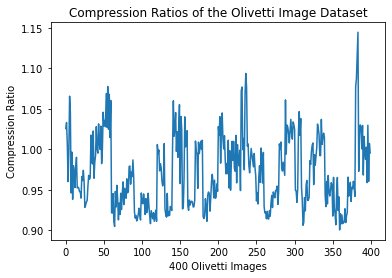

In [91]:
# PLOT of Compression Ratios of Olivetti Images:


plt.plot(img_comp_ratio_arr)
plt.ylabel('Compression Ratio')
plt.xlabel('400 Olivetti Images')
plt.title("Compression Ratios of the Olivetti Image Dataset")

In [92]:
# DECOMPRESS Image Function:


def decode_text2(encoded_text):
    current_text_code = ""
    decoded_img_list = []

    for bit in encoded_text:
        current_text_code += bit
        if(current_text_code in reverse_mapping2):
            character = reverse_mapping2[current_text_code]
            decoded_img_list.append(character)
            current_text_code = ""

    return decoded_img_list



def decompress(input_path):
    
    global letter_codes, reverse_mapping2          # For RESETTING these variable's GLOBAL version 
                                                   # instead of creating their local version
                                                   # To prevent their old values to remain stored - make them flush
    
    letter_codes = {}
    reverse_mapping2 = {}
    

    with open(input_path, 'rb') as file: #open(output_path, 'w') as output:
        bit_string = ""

        byte = file.read(1)      #Read 1 Byte at a time
        while(len(byte) > 0):
            byte = ord(byte)        #Byte to Unicode
            bits = bin(byte)[2:].rjust(8, '0')        #Unicode to Bits (ignoring 0b at start) in lengths of 8
            bit_string += bits
            byte = file.read(1)

        encoded_text_with_tree = remove_padding(bit_string)
        tree_bits, encoded_text = remove_tree(encoded_text_with_tree)
        tree_list = draw_tree(tree_bits)
        print("Recovered Tree: ", tree_list)
        tree_strg_nodes = tree_strg_to_Node_Converter(tree_list)
        tree_root = build_tree_initialiser(tree_strg_nodes)
        make_codes_2(tree_root)
        print("Reverse Mapping Decodes: ", reverse_mapping2)
        print("letter codes", letter_codes)
        decoded_img_list = decode_text2(encoded_text)



    print("Decompressed")
    print("Decoded Text for the Compressed file is:", decoded_img_list)
    return decoded_img_list 

In [97]:
# Decompressing the Images .huf files into .bmp Images Files:

decoded_images_data = np.empty((400,4096))                      # Recovered  Images Data as 1-D arrays each

for i in range(oliv['images'].shape[0]):
    huf_file = "Olivetti face {}.huf".format(i+1)


    decoded_img_list  = decompress(huf_file)
    decoded_img_array = np.array(decoded_img_list)
    decoded_images_data[i] = decoded_img_array
    
    decoded_img_2d_array = decoded_img_array.reshape(64,64)
    
    decoded_img_2d_array=np.uint8(decoded_img_2d_array) 
    decoded_img_object = im.fromarray(decoded_img_2d_array)      # Creating Image Object for Using PIL.Image.save()
    decoded_img_object.save(r'Olivetti face Recovered '+ str(i+1) +'.bmp')    # SAVING the Images as Gray-Scale ".bmp"
   

Recovered Tree:  ['#', '#', '#', '#', '#', 175, 184, '#', 178, 177, '#', '#', '#', '#', 147, 204, '#', '#', 45, '#', 95, '#', 72, 63, 145, '#', '#', '#', '#', 120, 106, '#', '#', 84, 87, 88, '#', 208, 48, '#', '#', '#', 119, 94, '#', '#', 100, 33, 108, '#', '#', '#', 116, 71, '#', 99, 53, 133, '#', '#', 162, 192, '#', '#', '#', 43, 134, 146, 193, '#', '#', '#', 180, '#', 190, '#', '#', 136, 51, '#', 206, '#', 125, 36, '#', '#', '#', 150, '#', '#', 54, 209, 41, 160, 183, '#', '#', '#', 161, '#', 197, '#', '#', 111, 126, 144, 179, '#', 185, '#', 167, '#', 202, 141, '#', '#', '#', '#', '#', 164, 169, '#', '#', '#', 127, '#', 86, 80, '#', '#', '#', '#', '#', 91, 60, '#', 29, 211, '#', '#', 27, 24, '#', 31, 21, 124, '#', '#', 83, '#', '#', 82, 76, 30, '#', '#', 69, 35, 102, '#', 201, '#', 38, '#', 52, '#', 104, 114, '#', '#', '#', '#', '#', '#', '#', 77, 56, '#', 92, '#', 75, 90, '#', '#', '#', 61, 223, 59, 112, '#', 121, '#', 118, 123, '#', '#', '#', '#', 55, 85, 103, '#', 115, 93, '#', '#

Decoded Text for the Compressed file is: [96, 112, 123, 139, 148, 160, 165, 172, 175, 181, 185, 190, 193, 193, 195, 199, 199, 203, 194, 203, 204, 206, 212, 212, 219, 223, 224, 224, 224, 222, 221, 214, 210, 207, 203, 204, 203, 202, 202, 198, 194, 194, 198, 195, 194, 197, 193, 191, 191, 192, 188, 187, 187, 184, 183, 181, 172, 162, 143, 107, 103, 67, 69, 70, 99, 113, 125, 139, 154, 163, 166, 169, 177, 181, 183, 185, 192, 193, 195, 199, 199, 197, 199, 199, 205, 206, 214, 214, 219, 221, 223, 224, 224, 220, 220, 217, 210, 207, 205, 201, 204, 200, 202, 199, 195, 198, 197, 193, 193, 195, 195, 192, 192, 191, 189, 187, 189, 185, 184, 181, 170, 161, 146, 103, 99, 60, 53, 53, 93, 109, 129, 145, 159, 164, 168, 169, 175, 178, 185, 184, 190, 190, 193, 199, 201, 199, 204, 202, 206, 206, 213, 214, 218, 221, 222, 224, 224, 219, 218, 213, 208, 206, 205, 203, 202, 200, 200, 199, 199, 197, 198, 197, 194, 194, 194, 192, 191, 190, 190, 188, 187, 185, 184, 180, 171, 160, 146, 109, 88, 60, 55, 55, 97, 115, 135

Reverse Mapping Decodes:  {'0000000': 183, '0000001': 190, '000001': 139, '000010': 147, '000011': 163, '000100000': 38, '0001000010': 211, '0001000011': 20, '000100010': 206, '000100011': 205, '00010010': 107, '00010011': 92, '000101': 160, '000110': 134, '0001110': 188, '00011110': 30, '00011111': 36, '0010000': 118, '001000100': 40, '001000101': 60, '00100011': 77, '001001': 131, '001010': 123, '001011': 149, '001100': 164, '0011010': 189, '00110110': 192, '0011011100': 24, '00110111010': 236, '00110111011': 45, '001101111': 80, '00111000': 193, '00111001': 34, '0011101': 28, '001111': 127, '010000': 148, '010001': 143, '010010': 124, '010011': 158, '010100': 172, '010101': 126, '010110': 153, '01011100': 97, '01011101': 94, '01011110': 95, '01011111': 191, '011000': 162, '011001000': 203, '011001001': 90, '0110010100': 64, '0110010101': 56, '011001011': 70, '0110011': 119, '011010000': 73, '011010001': 54, '011010010': 35, '011010011': 88, '0110101': 116, '011011': 146, '011100': 1

Decompressed
Decoded Text for the Compressed file is: [48, 65, 90, 108, 126, 131, 146, 160, 169, 183, 187, 191, 192, 195, 198, 200, 200, 203, 205, 209, 207, 210, 212, 211, 213, 214, 212, 212, 211, 209, 209, 210, 209, 209, 209, 208, 210, 212, 210, 211, 212, 212, 210, 210, 209, 208, 205, 205, 203, 201, 198, 195, 189, 189, 182, 175, 171, 171, 164, 148, 124, 131, 126, 107, 49, 64, 86, 113, 130, 136, 147, 161, 174, 187, 189, 192, 194, 198, 201, 202, 201, 204, 206, 209, 211, 210, 212, 212, 213, 213, 212, 212, 211, 209, 209, 209, 212, 210, 210, 209, 210, 210, 211, 211, 212, 211, 211, 211, 210, 209, 206, 205, 205, 201, 199, 194, 189, 184, 182, 173, 172, 169, 158, 143, 127, 128, 129, 108, 44, 62, 87, 115, 138, 138, 147, 163, 178, 189, 190, 190, 195, 199, 201, 201, 201, 203, 204, 207, 209, 209, 214, 212, 213, 213, 213, 211, 211, 208, 210, 209, 209, 212, 210, 209, 210, 210, 209, 212, 211, 213, 212, 211, 208, 210, 207, 203, 204, 201, 197, 197, 189, 186, 182, 179, 172, 168, 158, 143, 127, 127, 125,

letter codes {197: '000000', 152: '000001', 162: '000010', 207: '000011', 208: '000100', 158: '000101', 161: '000110', 136: '000111', 89: '0010000', 88: '0010001', 79: '001001000', 67: '001001001', 212: '001001010', 57: '001001011', 76: '0010011000', 47: '0010011001', 70: '0010011010', 45: '0010011011', 77: '0010011100', 49: '0010011101', 73: '001001111', 160: '001010', 104: '00101100', 83: '00101101', 96: '00101110', 116: '00101111', 168: '001100', 209: '001101', 128: '0011100', 111: '0011101', 191: '001111', 81: '01000000', 60: '0100000100', 44: '01000001010', 53: '01000001011', 31: '0100000110', 37: '0100000111', 126: '0100001', 163: '010001', 206: '0100100', 173: '0100101', 181: '0100110', 123: '0100111', 133: '0101000', 103: '01010010', 100: '01010011', 140: '010101', 179: '010110', 210: '0101110', 147: '0101111', 142: '0110000', 189: '0110001', 183: '0110010', 130: '0110011', 150: '0110100', 102: '01101010', 112: '01101011', 63: '011011000', 64: '011011001', 108: '01101101', 167:

Decompressed
Decoded Text for the Compressed file is: [109, 116, 140, 159, 171, 182, 184, 181, 182, 183, 188, 191, 193, 194, 197, 197, 195, 194, 193, 193, 194, 194, 195, 197, 199, 201, 201, 203, 202, 201, 201, 199, 198, 198, 199, 197, 199, 197, 199, 198, 194, 192, 191, 188, 186, 185, 181, 179, 178, 178, 181, 181, 179, 174, 171, 167, 160, 150, 142, 133, 129, 126, 126, 126, 112, 115, 135, 153, 166, 179, 183, 181, 181, 184, 188, 192, 192, 198, 200, 200, 200, 198, 197, 195, 195, 197, 198, 199, 200, 201, 203, 204, 203, 201, 203, 201, 201, 201, 203, 200, 201, 201, 202, 201, 198, 195, 195, 191, 189, 188, 184, 182, 183, 181, 182, 182, 177, 174, 169, 165, 155, 148, 139, 131, 127, 125, 125, 126, 119, 116, 132, 146, 161, 174, 182, 181, 181, 185, 190, 191, 195, 200, 204, 202, 202, 200, 200, 200, 200, 200, 202, 200, 200, 203, 205, 206, 205, 203, 204, 204, 204, 205, 205, 205, 204, 203, 203, 202, 199, 197, 195, 191, 189, 186, 184, 183, 185, 183, 183, 181, 175, 174, 166, 163, 150, 143, 134, 129, 125, 

Recovered Tree:  ['#', '#', '#', '#', '#', '#', 138, 161, '#', 172, 194, '#', '#', 136, 166, '#', '#', '#', '#', 217, 99, 212, '#', '#', '#', 82, 80, 105, 218, '#', 207, '#', '#', 94, 108, 214, '#', '#', '#', 144, 171, '#', '#', '#', 88, '#', 97, 92, 120, 190, '#', '#', 148, '#', 123, 143, '#', 173, 151, '#', '#', '#', '#', 142, '#', 210, '#', '#', 93, 102, 221, '#', '#', 202, 201, 140, '#', '#', '#', 195, 205, 189, '#', '#', '#', 222, 111, 141, 178, '#', '#', '#', 175, '#', '#', '#', 101, 223, '#', '#', 81, 95, 100, '#', '#', 110, 84, 112, '#', 184, '#', 130, 139, '#', '#', 179, '#', 203, '#', 211, '#', '#', '#', 228, '#', 224, 66, '#', '#', 237, 226, 227, '#', '#', '#', 64, 73, '#', 71, 69, '#', '#', 72, 79, '#', 74, 70, '#', 186, 187, '#', '#', '#', '#', '#', 185, '#', 126, '#', 113, '#', '#', 77, 83, 107, '#', '#', 199, '#', 87, 216, '#', '#', 206, 86, 129, '#', '#', 188, '#', 162, '#', 213, 119, '#', '#', 131, 152, 182, '#', '#', '#', '#', 198, 169, 183, '#', '#', 200, 150, '#', 1

Reverse Mapping Decodes:  {'000000': 167, '000001': 158, '000010': 214, '0000110': 219, '0000111': 223, '0001000000': 233, '00010000010': 100, '00010000011': 114, '000100001': 120, '00010001': 146, '0001001': 128, '000101': 175, '000110': 178, '0001110': 150, '0001111': 127, '001000': 209, '001001': 212, '001010': 216, '001011': 202, '001100': 206, '001101': 208, '00111000': 136, '001110010': 121, '001110011': 115, '0011101': 170, '001111': 181, '010000': 188, '0100010': 159, '01000110': 135, '01000111': 142, '0100100': 166, '0100101': 126, '010011': 189, '0101000': 225, '0101001': 131, '010101': 195, '010110': 182, '0101110': 228, '0101111': 148, '011000': 184, '0110010': 227, '0110011': 229, '011010': 205, '011011': 194, '011100': 199, '011101': 204, '011110': 180, '011111': 198, '100000': 197, '1000010': 153, '100001100000': 242, '100001100001': 76, '100001100010': 97, '100001100011': 110, '10000110010': 118, '100001100110': 101, '100001100111': 105, '100001101000': 103, '1000011010

Reverse Mapping Decodes:  {'000000': 187, '000001': 188, '000010': 207, '0000110': 131, '000011100': 68, '000011101': 93, '00001111': 104, '000100000': 88, '000100001': 95, '0001000100': 67, '0001000101': 47, '0001000110': 59, '0001000111': 42, '000100100': 46, '0001001010': 34, '0001001011': 57, '0001001100': 33, '0001001101': 41, '0001001110': 36, '0001001111': 31, '000101000': 80, '000101001': 91, '00010101': 103, '0001011': 174, '0001100': 138, '000110100': 70, '000110101': 84, '00011011': 100, '000111': 191, '001000000': 51, '0010000010': 226, '0010000011': 32, '001000010': 74, '001000011': 45, '0010001': 130, '001001': 209, '001010': 208, '001011': 206, '0011000': 166, '0011001': 116, '0011010': 53, '00110110': 119, '00110111': 101, '001110': 189, '00111100': 106, '00111101': 109, '0011111': 168, '010000': 186, '0100010': 154, '0100011': 152, '0100100': 135, '01001010': 105, '01001011': 112, '0100110': 136, '010011100': 48, '010011101': 76, '010011110': 219, '0100111110': 60, '01

Reverse Mapping Decodes:  {'0000000': 109, '0000001': 189, '000001': 204, '00001000': 97, '000010010': 82, '000010011': 85, '0000101': 122, '0000110': 188, '0000111': 34, '000100': 199, '0001010000': 84, '0001010001': 73, '0001010010': 16, '0001010011': 64, '000101010': 52, '000101011': 95, '000101100': 72, '0001011010': 61, '00010110110': 219, '00010110111': 15, '00010111': 60, '00011000': 36, '00011001': 101, '00011010': 155, '00011011': 93, '000111': 206, '001000': 202, '0010010': 146, '0010011': 173, '00101000': 170, '00101001': 66, '00101010': 21, '00101011': 100, '001011': 200, '001100': 201, '0011010': 128, '0011011': 192, '0011100': 140, '0011101': 127, '0011110': 154, '0011111': 135, '0100000': 125, '0100001': 113, '0100010': 160, '01000110': 151, '01000111': 218, '010010': 205, '0100110': 141, '0100111': 121, '0101000': 193, '010100100': 87, '010100101': 54, '010100110': 80, '010100111': 50, '01010100': 106, '01010101': 144, '0101011': 174, '01011000': 20, '01011001': 42, '01

Decompressed
Decoded Text for the Compressed file is: [134, 138, 147, 155, 162, 162, 166, 172, 179, 178, 181, 177, 174, 178, 178, 174, 181, 178, 178, 177, 178, 183, 189, 189, 191, 197, 197, 194, 197, 194, 194, 195, 193, 193, 195, 194, 194, 194, 190, 187, 187, 187, 181, 178, 174, 169, 168, 165, 154, 153, 152, 148, 142, 145, 144, 142, 132, 125, 113, 107, 85, 35, 25, 14, 129, 139, 143, 155, 162, 164, 167, 170, 178, 178, 179, 181, 178, 179, 182, 180, 182, 184, 183, 184, 187, 191, 192, 190, 195, 195, 199, 194, 198, 194, 193, 195, 194, 193, 193, 195, 191, 187, 189, 190, 189, 191, 186, 183, 179, 173, 168, 168, 162, 154, 157, 150, 146, 148, 146, 144, 133, 123, 112, 103, 83, 42, 17, 25, 122, 142, 148, 157, 162, 165, 167, 170, 174, 177, 181, 180, 186, 177, 183, 185, 185, 187, 189, 190, 191, 194, 195, 195, 200, 200, 200, 200, 200, 197, 192, 193, 194, 197, 195, 197, 193, 187, 184, 191, 192, 192, 190, 184, 181, 177, 173, 171, 163, 155, 153, 153, 148, 149, 152, 147, 136, 124, 114, 104, 88, 40, 21, 2

Decompressed
Decoded Text for the Compressed file is: [83, 123, 133, 152, 169, 179, 179, 181, 186, 186, 187, 190, 191, 192, 193, 195, 194, 195, 197, 198, 197, 197, 198, 195, 195, 197, 199, 198, 197, 197, 197, 195, 193, 192, 192, 192, 189, 187, 186, 186, 184, 184, 184, 185, 184, 182, 179, 180, 178, 178, 173, 167, 163, 157, 152, 152, 149, 145, 140, 133, 125, 119, 104, 92, 86, 118, 133, 155, 168, 177, 179, 181, 185, 187, 189, 191, 193, 194, 195, 195, 198, 199, 198, 200, 197, 200, 200, 198, 199, 199, 200, 199, 198, 198, 198, 197, 195, 197, 195, 194, 190, 190, 190, 188, 187, 189, 187, 188, 187, 186, 183, 183, 181, 179, 173, 169, 167, 162, 157, 153, 152, 149, 140, 133, 125, 119, 104, 88, 77, 113, 135, 153, 165, 173, 177, 180, 183, 188, 191, 192, 193, 194, 198, 199, 201, 200, 201, 203, 200, 202, 200, 201, 201, 202, 200, 199, 200, 201, 200, 198, 198, 200, 195, 193, 191, 193, 191, 189, 189, 191, 188, 189, 190, 189, 189, 187, 183, 179, 175, 173, 170, 165, 160, 154, 153, 150, 142, 132, 123, 118, 

Recovered Tree:  ['#', '#', '#', '#', '#', '#', 207, 193, '#', '#', 116, '#', '#', 20, 37, '#', '#', 18, 15, 70, '#', '#', '#', 43, 60, 107, '#', 97, 100, '#', '#', '#', 148, '#', 30, 79, '#', '#', '#', 65, 40, 29, 140, '#', '#', '#', 99, 64, 159, '#', '#', '#', 38, 68, 91, 133, '#', '#', '#', 212, 192, '#', '#', 164, '#', 122, 27, '#', '#', 73, 101, 150, '#', '#', 201, '#', 139, 166, '#', '#', '#', 102, 80, 171, 200, '#', '#', '#', '#', '#', 174, 136, 203, '#', '#', 165, 155, 211, '#', '#', '#', 157, 167, '#', 158, '#', '#', 66, 34, 85, '#', '#', '#', '#', 77, '#', '#', 14, 16, '#', 12, 13, '#', 96, 69, 92, '#', 163, '#', '#', 218, 36, '#', 57, 104, '#', '#', '#', 210, '#', 162, 182, '#', 202, 208, '#', '#', '#', 160, 143, '#', '#', 111, 87, '#', 108, 130, '#', '#', 124, 175, '#', '#', 128, 103, 142, '#', '#', '#', '#', '#', '#', 188, 173, '#', 161, 168, '#', '#', '#', 89, '#', 56, 95, '#', 26, 33, '#', 180, '#', 88, 24, '#', '#', '#', 199, '#', 123, '#', 42, '#', '#', 17, '#', 7, 11,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Recovered Tree:  ['#', '#', '#', '#', '#', '#', '#', 182, 163, '#', 141, 86, '#', '#', 82, 61, '#', 90, 187, '#', '#', '#', 89, 142, '#', 203, 93, '#', '#', 179, 210, '#', 209, '#', 216, 53, '#', '#', '#', '#', 96, 144, '#', 149, 186, '#', '#', '#', 45, 208, 185, '#', 127, '#', 206, 52, '#', '#', '#', 129, 197, '#', 200, 211, '#', '#', 166, 148, '#', 188, 132, '#', '#', '#', '#', '#', 95, 91, '#', 150, 102, '#', '#', '#', 60, 63, '#', 65, 55, '#', 119, 139, '#', '#', '#', '#', 143, 183, 218, '#', 164, 202, '#', '#', 154, 157, '#', 175, 172, '#', '#', '#', '#', 92, 114, '#', 140, 191, '#', 113, '#', 173, 189, '#', '#', '#', 174, '#', 131, 71, '#', '#', 81, 48, '#', 57, 70, '#', '#', '#', 213, 62, 198, '#', 159, 214, '#', '#', '#', '#', '#', '#', 147, '#', 85, '#', '#', 41, 223, '#', '#', 32, '#', 27, 21, '#', 35, 31, '#', 201, 105, '#', '#', 194, 94, '#', 170, 199, '#', '#', '#', 165, 167, '#', '#', 80, 73, '#', 124, 75, '#', '#', 128, '#', 217, 79, '#', 115, '#', 152, 220, '#', '#', '#

letter codes {167: '000000', 122: '0000010', 128: '0000011', 80: '00001000', 100: '00001001', 54: '000010100', 65: '0000101010', 57: '0000101011', 52: '0000101100', 56: '0000101101', 37: '00001011100', 218: '000010111010', 219: '000010111011', 41: '0000101111', 194: '0000110', 38: '0000111000', 44: '0000111001', 40: '0000111010', 212: '0000111011', 82: '00001111', 125: '0001000', 119: '0001001', 205: '000101', 188: '0001100', 76: '0001101', 123: '0001110', 116: '0001111', 136: '001000', 126: '0010010', 169: '0010011', 77: '00101000', 81: '00101001', 127: '0010101', 142: '001011', 93: '00110000', 90: '00110001', 62: '001100100', 211: '001100101', 85: '00110011', 207: '001101', 106: '0011100', 174: '0011101', 148: '001111', 206: '010000', 145: '010001', 112: '01001000', 74: '01001001', 183: '0100101', 72: '01001100', 79: '01001101', 67: '01001110', 53: '010011110', 46: '0100111110', 63: '0100111111', 132: '0101000', 192: '0101001', 185: '0101010', 83: '01010110', 95: '01010111', 186: '01

Decompressed
Decoded Text for the Compressed file is: [61, 63, 82, 81, 113, 180, 211, 216, 218, 219, 220, 219, 217, 217, 209, 205, 203, 200, 198, 194, 194, 190, 189, 190, 191, 191, 191, 193, 195, 199, 198, 199, 198, 195, 201, 200, 201, 201, 204, 202, 202, 204, 203, 202, 203, 201, 202, 199, 200, 197, 194, 193, 191, 190, 183, 180, 177, 174, 165, 159, 148, 145, 100, 52, 65, 62, 86, 94, 127, 198, 213, 219, 220, 220, 220, 218, 217, 214, 208, 206, 204, 202, 200, 195, 198, 192, 191, 192, 191, 191, 193, 193, 195, 197, 198, 193, 197, 198, 201, 199, 200, 200, 205, 202, 201, 203, 204, 204, 204, 201, 202, 200, 201, 199, 195, 192, 192, 192, 188, 182, 183, 175, 168, 159, 153, 144, 113, 49, 66, 63, 105, 99, 145, 209, 216, 223, 224, 222, 220, 218, 216, 213, 212, 209, 206, 205, 200, 200, 197, 197, 195, 192, 191, 191, 192, 194, 194, 194, 197, 195, 197, 198, 199, 197, 199, 202, 204, 205, 204, 207, 208, 207, 206, 205, 203, 202, 202, 200, 197, 194, 191, 194, 192, 188, 186, 179, 170, 160, 155, 146, 118, 62,

Reverse Mapping Decodes:  {'0000000': 173, '0000001': 59, '000001': 146, '000010': 106, '000011': 149, '0001000': 100, '000100100': 205, '0001001010': 208, '0001001011': 21, '0001001100': 31, '0001001101': 209, '0001001110': 29, '0001001111': 49, '000101000': 203, '000101001': 199, '00010101': 70, '0001011': 102, '0001100': 96, '0001101': 180, '000111': 128, '0010000': 168, '0010001': 167, '001001': 163, '0010100000': 26, '0010100001': 33, '0010100010': 40, '0010100011': 27, '001010010': 51, '001010011': 46, '0010101': 93, '001011': 126, '001100': 151, '001101': 121, '001110': 119, '001111': 154, '010000000': 193, '010000001': 37, '01000001': 75, '01000010': 64, '01000011': 82, '0100010': 178, '0100011': 77, '010010': 118, '010011': 150, '0101000': 133, '0101001': 182, '0101010': 172, '0101011': 109, '010110': 148, '0101110': 112, '01011110': 187, '010111110': 65, '010111111': 83, '0110000': 139, '0110001': 171, '011001000': 32, '011001001': 44, '01100101': 179, '0110011': 101, '011010

Recovered Tree:  ['#', '#', '#', '#', '#', '#', 139, 138, '#', 133, '#', '#', 77, 197, '#', 90, 63, '#', '#', 116, '#', 160, '#', 198, '#', 49, '#', 26, 31, '#', 134, 122, '#', '#', '#', 143, '#', 172, 165, '#', '#', 173, 167, '#', 99, 188, '#', '#', 113, '#', '#', 71, 84, '#', 81, '#', '#', 201, 204, 195, '#', 148, '#', 166, 94, '#', '#', '#', '#', '#', 83, '#', 163, 174, 106, '#', '#', '#', 79, 85, 93, 108, '#', '#', '#', 168, '#', 53, 70, 115, '#', '#', '#', 87, 62, '#', 48, 161, '#', '#', '#', 69, 44, 75, '#', 182, 72, '#', '#', '#', 109, 142, '#', '#', 55, 158, '#', '#', 183, 190, '#', '#', 50, 46, 178, '#', '#', '#', 154, 151, 121, '#', 141, '#', 105, '#', '#', 64, '#', 45, 34, 74, '#', '#', '#', '#', '#', '#', '#', 89, 60, '#', '#', '#', '#', 29, 27, 207, '#', 206, '#', 202, 22, '#', '#', 42, 68, 43, '#', '#', 92, 193, '#', 61, 181, '#', '#', 162, 100, '#', '#', '#', 30, 41, '#', '#', '#', '#', 209, 20, '#', 18, 23, '#', '#', 221, 16, '#', 219, 218, '#', '#', 32, 208, 38, 131, '

Decompressed
Decoded Text for the Compressed file is: [72, 55, 46, 80, 99, 105, 111, 116, 127, 140, 147, 150, 151, 154, 158, 162, 172, 171, 169, 179, 179, 175, 170, 163, 162, 159, 154, 155, 155, 160, 163, 159, 157, 159, 155, 154, 158, 159, 167, 172, 164, 168, 172, 173, 174, 169, 164, 162, 163, 167, 171, 173, 171, 164, 157, 153, 149, 146, 144, 135, 132, 130, 134, 121, 68, 52, 45, 79, 101, 104, 110, 114, 124, 130, 135, 142, 148, 153, 153, 152, 158, 161, 164, 174, 182, 179, 182, 175, 168, 163, 157, 154, 150, 158, 164, 162, 158, 160, 159, 155, 158, 165, 174, 180, 175, 170, 175, 175, 175, 171, 172, 169, 169, 174, 171, 169, 164, 159, 160, 162, 158, 151, 144, 135, 132, 133, 132, 123, 69, 52, 44, 74, 104, 101, 108, 113, 121, 119, 119, 128, 139, 142, 145, 147, 149, 152, 157, 164, 173, 174, 174, 179, 173, 166, 159, 157, 149, 152, 161, 163, 161, 163, 161, 157, 158, 164, 170, 173, 170, 165, 168, 170, 170, 170, 168, 170, 171, 180, 173, 169, 162, 152, 157, 160, 158, 152, 145, 138, 132, 132, 136, 129

Recovered Tree:  ['#', '#', '#', '#', '#', '#', 127, 93, '#', '#', '#', '#', '#', 208, 22, '#', '#', 202, 175, 158, 159, 60, '#', '#', '#', 168, '#', 221, 191, '#', 163, 167, 145, '#', '#', 90, 129, '#', 96, 95, '#', '#', '#', '#', 74, 66, 124, '#', 111, 81, '#', '#', 122, '#', 148, 139, '#', 110, 107, '#', '#', '#', '#', '#', '#', 29, 153, '#', '#', 26, 41, 31, 92, '#', '#', 144, '#', 40, '#', 166, 157, 123, '#', '#', 100, 106, '#', 112, 113, '#', '#', '#', 105, '#', 68, 54, '#', 121, 102, '#', '#', 109, 104, '#', 114, '#', 142, '#', 33, '#', 43, '#', 179, 172, '#', '#', '#', '#', '#', 103, '#', 73, 65, '#', '#', 141, 143, 108, '#', '#', '#', 140, '#', 56, 34, '#', '#', '#', 151, 155, '#', '#', '#', 178, 186, '#', 227, '#', 21, 213, '#', 171, '#', 182, 169, '#', '#', '#', '#', '#', 236, 197, 201, '#', '#', 230, 217, '#', 23, 205, '#', '#', 224, '#', 25, 15, '#', '#', 218, 223, 226, 57, '#', '#', '#', '#', 150, 47, '#', '#', '#', 180, 164, '#', 174, '#', 184, 229, '#', '#', '#', 206, 2

Decompressed
Decoded Text for the Compressed file is: [139, 144, 150, 160, 166, 162, 154, 150, 151, 152, 155, 155, 157, 157, 158, 161, 168, 174, 182, 186, 189, 189, 188, 188, 188, 191, 194, 199, 199, 202, 202, 201, 195, 188, 183, 181, 181, 182, 180, 180, 178, 178, 177, 174, 172, 174, 171, 173, 169, 167, 165, 163, 160, 162, 160, 158, 155, 149, 144, 136, 129, 123, 113, 93, 146, 159, 163, 173, 180, 178, 171, 163, 160, 157, 155, 157, 157, 162, 166, 172, 178, 180, 187, 189, 194, 195, 195, 195, 193, 195, 199, 198, 201, 203, 203, 203, 201, 197, 190, 189, 188, 184, 185, 183, 184, 182, 182, 179, 175, 177, 175, 175, 173, 171, 169, 167, 165, 163, 163, 163, 158, 152, 146, 140, 138, 130, 121, 106, 151, 163, 170, 179, 185, 186, 182, 178, 172, 168, 162, 165, 167, 175, 182, 185, 189, 188, 191, 194, 199, 201, 201, 202, 199, 200, 202, 200, 202, 204, 204, 205, 205, 204, 202, 200, 193, 191, 187, 186, 187, 186, 187, 184, 184, 179, 181, 178, 178, 174, 174, 170, 170, 167, 167, 165, 160, 153, 147, 142, 140, 1

Decompressed
Decoded Text for the Compressed file is: [93, 115, 130, 148, 150, 150, 150, 149, 153, 154, 152, 150, 150, 147, 150, 154, 157, 155, 157, 155, 153, 154, 150, 152, 154, 154, 145, 143, 142, 136, 133, 139, 140, 144, 143, 148, 147, 147, 146, 144, 141, 134, 128, 126, 128, 131, 127, 134, 139, 141, 143, 138, 135, 132, 125, 118, 109, 103, 108, 99, 63, 40, 35, 33, 107, 126, 136, 149, 152, 149, 151, 150, 155, 155, 154, 152, 152, 154, 154, 157, 160, 162, 161, 160, 151, 154, 154, 151, 154, 158, 153, 150, 149, 146, 142, 146, 144, 145, 146, 150, 150, 145, 148, 147, 143, 133, 130, 132, 128, 128, 133, 139, 138, 141, 142, 135, 133, 131, 126, 116, 112, 106, 105, 105, 74, 43, 34, 33, 120, 136, 145, 151, 152, 151, 149, 152, 154, 155, 154, 153, 154, 157, 157, 157, 161, 160, 160, 161, 151, 158, 158, 150, 152, 158, 158, 154, 152, 150, 149, 150, 149, 147, 150, 148, 151, 151, 152, 146, 141, 134, 133, 133, 129, 122, 133, 133, 135, 141, 139, 132, 126, 125, 125, 113, 111, 106, 105, 105, 85, 49, 34, 33,

Reverse Mapping Decodes:  {'000000': 114, '000001': 151, '000010': 127, '000011': 200, '000100': 197, '000101': 150, '0001100': 183, '0001101': 110, '000111': 198, '0010000': 175, '0010001': 171, '001001': 113, '001010': 204, '00101100': 83, '0010110100': 80, '0010110101': 34, '001011011': 82, '0010111': 102, '0011000': 173, '0011001': 164, '0011010': 168, '0011011': 165, '0011100': 100, '0011101': 116, '0011110': 103, '0011111': 185, '01000000': 91, '01000001': 89, '0100001': 182, '010001': 202, '0100100': 118, '0100101': 178, '0100110': 105, '0100111': 210, '0101000': 139, '010100100': 77, '010100101': 60, '010100110': 74, '010100111': 66, '0101010': 162, '01010110': 211, '0101011100': 65, '010101110100': 212, '010101110101': 55, '01010111011': 37, '010101111': 73, '0101100': 101, '0101101': 97, '01011100': 84, '01011101': 94, '0101111': 158, '0110000': 120, '0110001': 181, '0110010': 174, '0110011': 129, '0110100': 109, '01101010': 85, '01101011': 88, '0110110': 207, '0110111': 189,

Decoded Text for the Compressed file is: [72, 60, 60, 75, 132, 171, 183, 183, 190, 194, 195, 194, 192, 193, 195, 195, 197, 194, 195, 195, 198, 200, 202, 203, 203, 204, 206, 203, 201, 206, 207, 206, 205, 206, 200, 204, 203, 200, 200, 199, 195, 197, 194, 192, 190, 188, 186, 187, 187, 185, 182, 184, 185, 188, 190, 186, 175, 174, 168, 162, 155, 155, 154, 150, 63, 53, 66, 79, 139, 173, 182, 188, 193, 193, 194, 191, 190, 190, 188, 192, 194, 191, 192, 194, 198, 198, 200, 202, 204, 204, 204, 204, 203, 207, 207, 205, 205, 205, 203, 203, 204, 203, 201, 200, 195, 197, 195, 194, 192, 192, 192, 191, 191, 191, 187, 188, 189, 188, 188, 183, 179, 178, 169, 162, 157, 158, 153, 149, 60, 51, 61, 81, 144, 175, 185, 189, 193, 195, 195, 191, 190, 191, 191, 192, 197, 194, 194, 197, 199, 202, 203, 204, 207, 206, 205, 206, 205, 208, 206, 206, 206, 205, 206, 205, 203, 204, 205, 203, 201, 200, 200, 198, 197, 197, 193, 191, 194, 192, 191, 189, 191, 190, 189, 184, 177, 174, 168, 163, 159, 158, 152, 147, 57, 47, 53

Reverse Mapping Decodes:  {'0000000': 208, '0000001': 118, '000001': 143, '0000100': 203, '0000101': 32, '000011': 139, '000100000': 48, '000100001': 69, '000100010': 71, '0001000110': 43, '0001000111': 65, '00010010': 99, '0001001100': 46, '0001001101': 25, '000100111': 38, '000101': 149, '0001100': 132, '000110100': 50, '000110101': 37, '00011011': 57, '000111': 187, '00100000': 51, '00100001': 52, '0010001': 201, '001001': 152, '0010100': 121, '0010101': 183, '001011': 145, '0011000': 204, '0011001': 182, '001101': 147, '001110': 193, '0011110': 170, '0011111': 113, '01000000': 88, '01000001': 54, '010000100': 62, '010000101': 30, '01000011': 86, '010001': 136, '01001000': 53, '01001001': 92, '0100101': 138, '0100110': 122, '0100111': 109, '010100000': 76, '010100001': 84, '01010001': 211, '0101001': 160, '0101010': 202, '0101011': 120, '0101100': 200, '010110100': 213, '010110101': 74, '01011011': 112, '0101110': 127, '01011110': 34, '0101111100': 67, '0101111101': 214, '010111111'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Decompressed
Decoded Text for the Compressed file is: [119, 121, 115, 125, 126, 124, 145, 150, 153, 160, 160, 141, 150, 145, 148, 152, 157, 150, 157, 157, 158, 152, 152, 157, 155, 162, 168, 175, 166, 167, 169, 170, 164, 155, 165, 160, 154, 154, 158, 155, 149, 146, 146, 145, 145, 147, 146, 139, 146, 139, 135, 134, 133, 131, 135, 133, 133, 141, 109, 132, 138, 143, 138, 122, 122, 112, 119, 130, 130, 126, 149, 144, 151, 155, 148, 144, 148, 149, 146, 140, 157, 147, 154, 160, 159, 157, 152, 150, 150, 155, 162, 168, 165, 164, 171, 170, 159, 151, 158, 163, 162, 151, 150, 151, 140, 141, 141, 141, 145, 148, 142, 142, 142, 140, 132, 134, 134, 130, 133, 131, 130, 138, 127, 131, 141, 140, 138, 132, 115, 118, 116, 130, 128, 132, 149, 145, 154, 152, 147, 147, 146, 146, 151, 146, 150, 145, 154, 155, 157, 153, 149, 147, 149, 147, 150, 159, 159, 158, 153, 162, 161, 155, 159, 160, 155, 145, 141, 143, 139, 141, 147, 141, 142, 142, 138, 141, 138, 132, 133, 134, 133, 135, 129, 136, 132, 135, 141, 136, 138, 

Recovered Tree:  ['#', '#', '#', '#', '#', '#', '#', 207, 106, '#', 114, 126, '#', 204, '#', 86, 125, '#', '#', '#', '#', '#', '#', 41, 27, 73, '#', '#', 64, 34, '#', 33, 36, '#', 50, '#', 49, 63, 205, '#', '#', 123, 84, '#', 173, 124, '#', '#', '#', 203, '#', 89, 144, '#', '#', 118, '#', 71, 72, '#', 110, 157, '#', '#', '#', 121, 88, 158, '#', '#', 141, 181, '#', '#', 82, 51, 154, '#', '#', '#', '#', '#', 134, 179, '#', 174, 138, '#', '#', 93, 100, 193, '#', '#', '#', 120, 112, '#', 127, 169, '#', '#', 136, '#', '#', '#', 30, '#', 22, 26, 47, 81, '#', 140, 135, '#', '#', '#', '#', 175, 101, '#', 155, 147, '#', '#', 108, 164, '#', '#', 76, 57, 122, '#', '#', '#', 195, 183, '#', 148, 129, '#', '#', 192, 152, '#', 191, 177, '#', '#', '#', '#', '#', '#', '#', '#', '#', '#', 29, 43, 66, 52, 70, 200, '#', 133, 153, '#', '#', '#', 79, '#', '#', '#', '#', 14, 17, 21, '#', 32, 210, '#', 44, 40, '#', 83, '#', '#', '#', 217, '#', 216, 214, '#', '#', 16, 213, 18, '#', 38, 31, '#', 130, 99, '#', '

Decompressed
Decoded Text for the Compressed file is: [70, 96, 124, 135, 136, 141, 148, 155, 163, 168, 169, 172, 174, 174, 175, 172, 174, 180, 180, 181, 182, 183, 184, 182, 185, 185, 184, 187, 190, 191, 189, 189, 192, 192, 190, 193, 194, 192, 197, 198, 202, 201, 202, 204, 204, 208, 209, 211, 211, 211, 209, 211, 213, 213, 214, 214, 211, 214, 197, 129, 64, 59, 83, 106, 77, 105, 127, 135, 138, 141, 148, 159, 165, 167, 170, 171, 170, 173, 172, 175, 180, 181, 181, 180, 181, 183, 183, 185, 186, 187, 187, 188, 190, 189, 186, 186, 191, 192, 190, 192, 194, 192, 194, 195, 200, 199, 201, 203, 205, 209, 209, 209, 212, 210, 210, 209, 213, 214, 214, 214, 212, 213, 217, 167, 82, 61, 82, 113, 86, 111, 124, 134, 139, 143, 149, 159, 165, 171, 171, 171, 169, 171, 172, 177, 180, 181, 180, 175, 180, 182, 182, 183, 184, 183, 184, 185, 187, 186, 184, 185, 187, 188, 189, 189, 190, 191, 192, 194, 198, 198, 201, 201, 204, 207, 208, 209, 210, 212, 210, 210, 212, 214, 214, 214, 212, 214, 219, 205, 102, 72, 92, 11

Decompressed
Decoded Text for the Compressed file is: [87, 72, 179, 211, 201, 206, 201, 201, 208, 212, 212, 209, 210, 207, 209, 207, 204, 200, 197, 190, 187, 180, 171, 169, 169, 158, 160, 163, 162, 160, 164, 159, 167, 165, 161, 161, 159, 155, 151, 149, 147, 148, 150, 147, 154, 152, 154, 152, 148, 151, 155, 157, 152, 155, 154, 154, 150, 147, 147, 149, 79, 14, 54, 37, 102, 81, 194, 209, 206, 206, 205, 207, 208, 217, 213, 211, 206, 209, 212, 209, 206, 207, 202, 200, 195, 182, 181, 177, 175, 159, 164, 166, 160, 158, 163, 157, 161, 165, 162, 164, 160, 162, 150, 149, 151, 152, 154, 154, 158, 153, 155, 153, 153, 154, 159, 153, 153, 158, 158, 160, 154, 150, 150, 153, 123, 15, 48, 45, 102, 101, 186, 209, 210, 207, 208, 209, 211, 217, 213, 209, 205, 216, 213, 212, 212, 214, 205, 202, 199, 189, 191, 185, 175, 165, 166, 164, 155, 153, 161, 158, 160, 170, 168, 168, 169, 162, 151, 149, 152, 154, 158, 162, 163, 160, 159, 158, 158, 154, 159, 157, 158, 161, 158, 161, 155, 152, 153, 157, 146, 51, 42, 47

Recovered Tree:  ['#', '#', '#', '#', '#', '#', '#', 146, 197, '#', 126, 65, '#', '#', 185, 163, '#', 169, 130, '#', '#', '#', 140, 113, '#', 115, 85, '#', '#', 112, 64, '#', 135, 179, '#', '#', '#', '#', 81, 153, '#', 107, '#', 149, 157, '#', '#', 152, '#', 160, 150, '#', 80, 44, '#', '#', '#', 123, 94, '#', 131, 92, '#', '#', 124, 74, '#', 96, 50, '#', '#', '#', '#', '#', 111, 82, '#', 88, 128, '#', '#', 190, 104, '#', 194, 66, '#', '#', '#', 70, 100, '#', 188, 204, '#', '#', 186, 47, '#', 89, 75, '#', '#', '#', '#', 106, 79, '#', 191, 52, '#', '#', '#', 136, 37, 189, '#', 46, 84, '#', '#', '#', '#', 177, 159, '#', 180, 42, '#', 202, 110, '#', '#', 102, 173, '#', 67, '#', '#', '#', 27, '#', 29, '#', 22, 229, '#', '#', '#', 228, 217, '#', 25, 223, '#', '#', 213, 17, 212, '#', '#', 26, 30, 33, '#', '#', '#', '#', '#', '#', 68, 49, '#', 77, 99, '#', '#', 105, '#', 144, 147, '#', 207, 48, '#', '#', '#', '#', 175, 40, 54, '#', 76, 51, '#', '#', '#', 148, 122, 101, '#', 93, 71, '#', '#', '

Reverse Mapping Decodes:  {'000000': 181, '0000010': 71, '0000011': 88, '000010': 206, '000011': 199, '000100': 175, '000101': 203, '000110': 204, '0001110000': 53, '0001110001': 41, '0001110010': 61, '0001110011': 42, '00011101': 97, '0001111': 145, '001000': 183, '001001000': 67, '001001001': 35, '00100101': 66, '0010011': 148, '0010100': 80, '0010101': 198, '00101100': 108, '00101101': 90, '0010111': 107, '001100': 187, '0011010': 142, '0011011': 134, '0011100': 190, '0011101': 159, '00111100': 86, '00111101': 70, '0011111': 150, '0100000': 120, '01000010': 99, '0100001100': 47, '0100001101': 30, '010000111': 23, '010001': 74, '0100100': 165, '0100101': 129, '0100110': 164, '0100111': 208, '010100000': 92, '010100001': 29, '010100010': 26, '010100011': 104, '0101001': 163, '0101010': 153, '0101011': 130, '0101100': 81, '0101101': 197, '0101110': 161, '01011110': 106, '01011111': 85, '0110000': 131, '0110001': 173, '0110010': 147, '0110011': 133, '0110100': 194, '0110101': 73, '01101

letter codes {134: '0000000', 161: '0000001', 160: '0000010', 25: '000001100', 21: '0000011010', 175: '0000011011', 32: '00000111', 109: '000010', 77: '0000110', 74: '0000111', 120: '000100', 115: '000101', 121: '000110', 173: '00011100', 166: '00011101', 72: '0001111', 113: '001000', 80: '0010010', 79: '0010011', 107: '001010', 124: '001011', 159: '0011000', 150: '0011001', 144: '0011010', 76: '0011011', 148: '0011100', 55: '00111010', 41: '00111011', 87: '001111', 86: '010000', 90: '010001', 143: '0100100', 138: '0100101', 103: '010011', 135: '0101000', 169: '01010010', 170: '01010011', 105: '010101', 94: '010110', 147: '0101110', 56: '010111100', 42: '010111101', 172: '010111110', 46: '010111111', 82: '0110000', 28: '01100010', 59: '01100011', 106: '011001', 102: '011010', 33: '011011000', 24: '011011001', 54: '01101101', 73: '0110111', 100: '011100', 162: '01110100', 40: '011101010', 49: '011101011', 141: '0111011', 101: '011110', 81: '0111110', 62: '01111110', 146: '01111111', 112

Decompressed
Decoded Text for the Compressed file is: [93, 93, 89, 76, 63, 63, 93, 130, 146, 160, 166, 170, 178, 186, 193, 195, 203, 204, 204, 205, 206, 207, 208, 210, 210, 209, 210, 210, 210, 209, 210, 211, 210, 210, 209, 211, 210, 212, 212, 211, 211, 211, 209, 211, 210, 211, 210, 208, 207, 206, 204, 204, 203, 202, 203, 201, 193, 184, 180, 175, 177, 177, 172, 170, 92, 94, 90, 74, 65, 67, 96, 131, 151, 163, 169, 175, 181, 187, 194, 198, 204, 204, 203, 206, 207, 206, 207, 211, 210, 210, 210, 209, 209, 210, 209, 210, 209, 210, 209, 211, 211, 211, 211, 210, 210, 210, 210, 210, 210, 211, 210, 209, 208, 208, 206, 205, 206, 204, 202, 200, 193, 184, 178, 174, 178, 177, 170, 167, 92, 94, 89, 73, 63, 68, 96, 140, 159, 168, 174, 179, 186, 190, 193, 198, 203, 203, 201, 204, 205, 206, 208, 208, 211, 208, 211, 210, 208, 209, 209, 209, 207, 209, 208, 208, 210, 210, 209, 208, 207, 208, 209, 209, 210, 210, 209, 208, 208, 207, 207, 206, 205, 204, 202, 201, 194, 186, 179, 177, 178, 177, 168, 165, 93, 93

In [ ]:
# All Images SUCCESSFULLY RECOVERED from .huf files !!

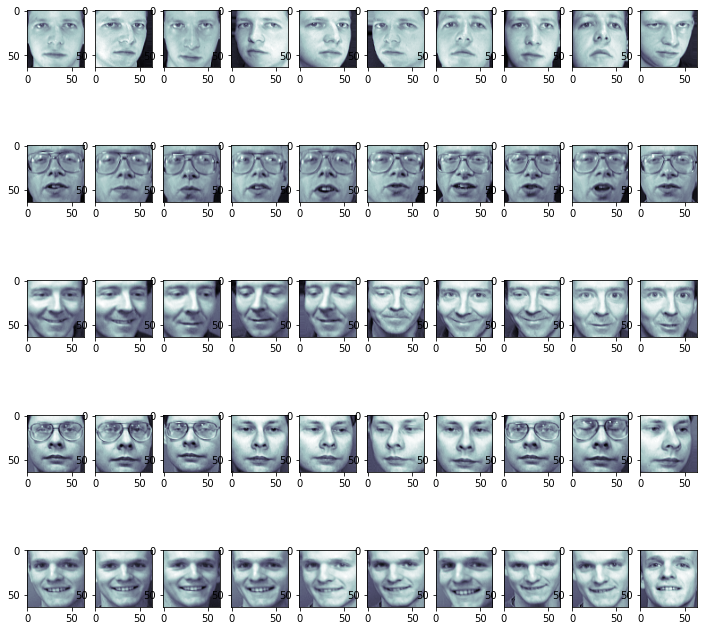

In [76]:
#Plotting the RECOVERED Face Images - Selecting 50 face images of 5 people with 10 face images each

fig2 = plt.figure(figsize=(12,12))
for i in range(50):
    bx= fig2.add_subplot(5,10,i+1)                         #Subplot with 5 rows and 10 cols (images) each row
    recov_img = plt.imread("Olivetti face Recovered {}.bmp".format(i+1))    # Load Image
    bx.imshow( recov_img, cmap=plt.cm.bone)                                 # Show Image
plt.show()

In [106]:
# MSE (Mean Square Error) of Each Recovered Images from Original Image:

mse = np.zeros(400)

for i in range(oliv['images'].shape[0]):
    img = plt.imread(r'Olivetti face '+ str(i+1) +'.bmp', format = "bmp")
    img_2d_array = np.array(img)
    img_array = img_2d_array.flatten()
    
    recov_im = decoded_images_data[i]
    
    mse[i] = (np.square(img_array - recov_im)).mean(axis=0)
    

In [105]:
mse       # ZERO MSE for All Recovered Images !!

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [ ]:
# Saurabh Chatterjee   22EE65R14